In [348]:
import numpy as np
import matplotlib.pyplot as plt
import subprocess
from pathlib import Path
import torch
import torch.nn as nn
import torch.optim as optim
import plumed
from scipy.interpolate import griddata

torch.manual_seed(42)

In [349]:
transitionAB=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetAB1")
transitionAB

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


,time,phi1,phi2,phi3,psi1,psi2,psi3,abmd.bias,abmd.phi1_min,abmd.phi2_min,abmd.phi3_min,abmd.force2
0,0.000,1.4301,-1.0556,-1.2035,-1.3319,-0.6971,1.3813,0.0000,8.5853,0.002,0.0107,0.0000
1,0.002,1.4321,-1.0489,-1.1961,-1.3369,-0.7075,1.3771,0.0072,8.5853,0.002,0.0092,49.7174
2,0.004,1.4366,-1.0328,-1.1807,-1.3491,-0.7327,1.3689,0.0735,8.5853,0.002,0.0065,504.8668
3,0.006,1.4386,-1.0128,-1.1666,-1.3631,-0.7649,1.3641,0.1266,8.5853,0.002,0.0044,863.6884
4,0.008,1.4358,-0.9915,-1.1587,-1.3758,-0.7999,1.3671,0.0608,8.5853,0.002,0.0034,386.4008
...,...,...,...,...,...,...,...,...,...,...,...,...
430,0.860,-1.2676,-1.0083,-1.2616,0.7173,-0.5576,1.0734,0.1752,0.0000,0.000,0.0034,6.8681
431,0.862,-1.2580,-1.0200,-1.2523,0.7254,-0.5374,1.0489,0.1931,0.0000,0.000,0.0034,8.4095
432,0.864,-1.2439,-1.0285,-1.2356,0.7310,-0.5266,1.0273,0.2276,0.0000,0.000,0.0034,11.4539
433,0.866,-1.2252,-1.0327,-1.2142,0.7326,-0.5246,1.0114,0.2909,0.0000,0.000,0.0034,17.2859


In [350]:
from skmatter.feature_selection import FPS

transitionAB1=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetAB1")
transitionAB2=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetAB2")
transitionAB3=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetAB3")
transitionAB4=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetAB4")
transitionAB5=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetAB5")
transitionBC1=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBC1")
transitionBC2=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBC2")
transitionBC3=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBC3")
transitionBC4=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBC4")
transitionBC5=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBC5")
transitionBA1=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBA1")
transitionBA2=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBA2")
transitionBA3=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBA3")
transitionBA4=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBA4")
transitionBA5=plumed.read_as_pandas("./ABMD_2Levels/COLVAR_ratchetBA5")

training_batches=np.vstack((transitionAB1.iloc[:,1:7],
                            transitionAB2.iloc[:,1:7],
                            transitionAB3.iloc[:,1:7],
                            transitionAB4.iloc[:,1:7],
                            transitionAB5.iloc[:,1:7],
                            transitionBC1.iloc[:,1:7],
                            transitionBC2.iloc[:,1:7],
                            transitionBC3.iloc[:,1:7],
                            transitionBC4.iloc[:,1:7],
                            transitionBC5.iloc[:,1:7],
                            transitionBA1.iloc[:,1:7],
                            transitionBA2.iloc[:,1:7],
                            transitionBA3.iloc[:,1:7],
                            transitionBA4.iloc[:,1:7],
                            transitionBA5.iloc[:,1:7])
                          )
   
print(training_batches.shape)
selector = FPS(n_to_select=1000,initialize=0)

selector.fit(training_batches[:,:3].T)
r_ndx=selector.selected_idx_

training_datapoints =training_batches[r_ndx,:]
training_datapoints.shape

(12483, 6)


+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++
+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt

(1000, 6)

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


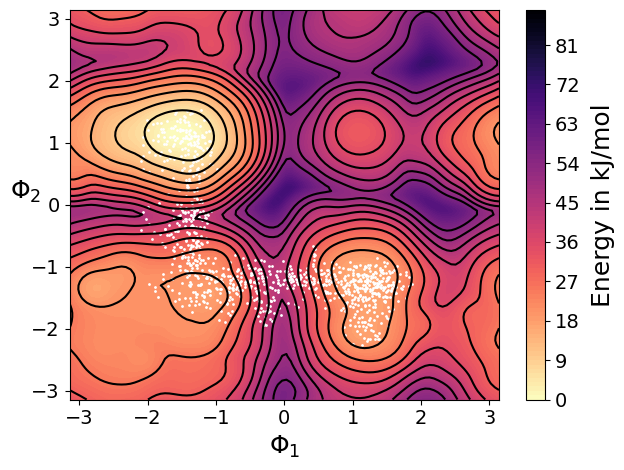

<Figure size 640x480 with 0 Axes>

In [351]:
data=plumed.read_as_pandas("fes-rew_phi1phi2.dat" )

phi_forward=training_datapoints[:,0]
psi_forward=training_datapoints[:,1]
    
phi_values = data['phi1']
psi_values = data['phi2']
file_free_values = data['file.free']

phi_grid, psi_grid = np.meshgrid(np.linspace(phi_values.min(), phi_values.max(), 100),
                                 np.linspace(psi_values.min(), psi_values.max(), 100))

file_free_grid = griddata((phi_values, psi_values), file_free_values, (phi_grid, psi_grid), method='cubic')

levels=np.arange(0,90,1)
s = plt.contourf(phi_grid, psi_grid, file_free_grid,levels, cmap='magma_r')

levels=np.arange(0,60,5)
plt.contour(phi_grid, psi_grid,file_free_grid,levels,colors='black')

plt.scatter(phi_forward,psi_forward,c='white',s=1)

cbar = plt.colorbar(s, shrink=1)
cbar.set_label(r'Energy in kJ/mol', rotation=90, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0)
plt.tight_layout()
plt.show()


plt.tight_layout()
plt.show()

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


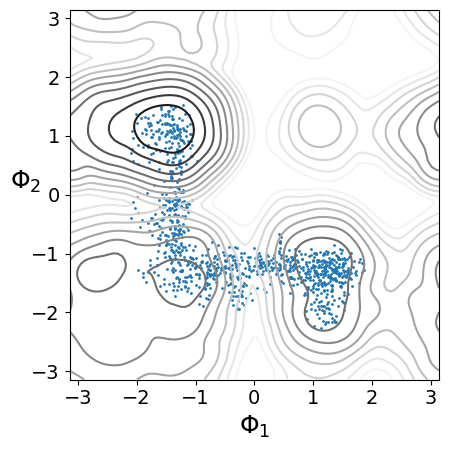

In [352]:
data=plumed.read_as_pandas("fes-rew_phi1phi2.dat" )

phi_forward=training_datapoints[:,0]
psi_forward=training_datapoints[:,1]
    
phi_values = data['phi1']
psi_values = data['phi2']
file_free_values = data['file.free']

phi_grid, psi_grid = np.meshgrid(np.linspace(phi_values.min(), phi_values.max(), 100),
                                 np.linspace(psi_values.min(), psi_values.max(), 100))

file_free_grid = griddata((phi_values, psi_values), file_free_values, (phi_grid, psi_grid), method='cubic')


fig, ax = plt.subplots(dpi=100)                  
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
ax.set_aspect('equal')
pp=ax.scatter(phi_forward,psi_forward,s=1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0)
plt.show()

(300, 6)


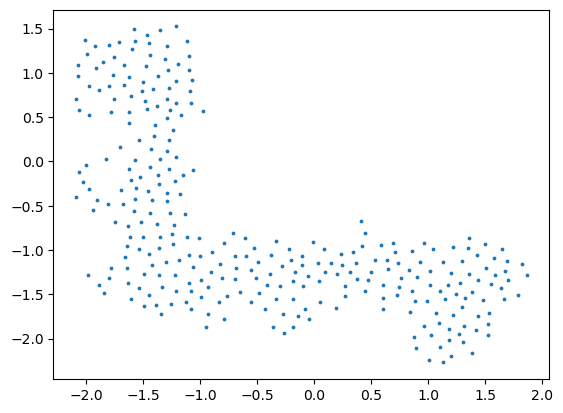

In [353]:
from skmatter.feature_selection import FPS

selector = FPS(n_to_select=300,initialize=0)

selector.fit(training_datapoints[:,:2].T)
r_ndx=selector.selected_idx_

model_datapoints =training_datapoints[r_ndx,:]

print(model_datapoints.shape)

plt.figure()
plt.scatter(model_datapoints[:,0],model_datapoints[:,1],s=3,alpha=1)
plt.show()

In [354]:
labels = np.full(training_datapoints.shape[0], 2.0)

center1 = np.array([1.6, -1.1])
center1_2 = np.array([1.6, -2])
center2 = np.array([-1.3, -1.3])
center3 = np.array([-1.5, 1.7])

r1 = 0.7
r1_2 = 0.7
r2 = 0.6
r3 = 0.8

distances_center1 = np.linalg.norm(training_datapoints[:,:2] - center1, axis=1)
distances_center1_2 = np.linalg.norm(training_datapoints[:,:2] - center1_2, axis=1)
distances_center2 = np.linalg.norm(training_datapoints[:,:2] - center2, axis=1)
distances_center3 = np.linalg.norm(training_datapoints[:,:2] - center3, axis=1)

indices_center1 = np.where(distances_center1 < r1)
labels[indices_center1] = 0

indices_center1_2 = np.where(distances_center1_2 < r1_2)
labels[indices_center1_2] = 0

indices_center2 = np.where(distances_center2 < r2)
labels[indices_center2] = 0.5

indices_center3 = np.where(distances_center3 < r3)
labels[indices_center3] = 1


training_datapoints_labels=labels
training_datapoints_labels.shape

(1000,)

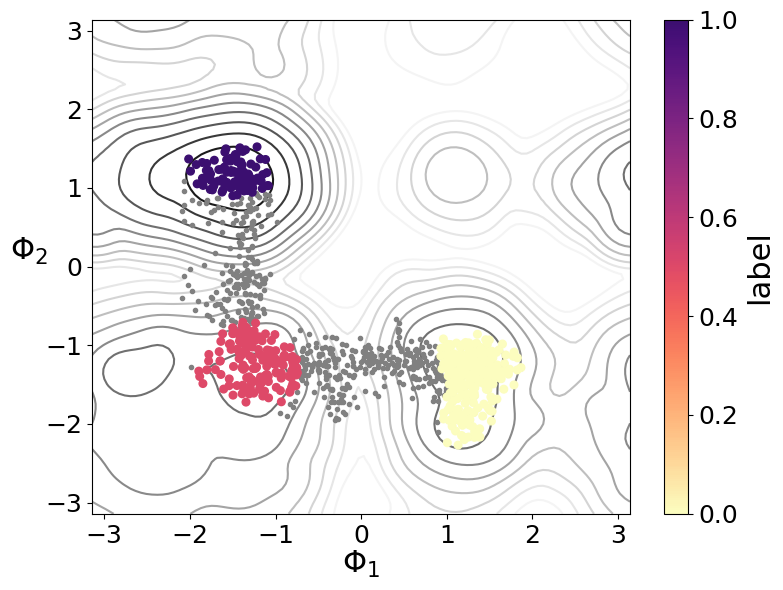

In [355]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib import colors as mcolors


magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256)))  

fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)             
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
ax.plot(training_datapoints[:,0],training_datapoints[:,1],'o', color='gray',markersize=3)
ndx=np.where((training_datapoints_labels!=2.0))[0]
pp=ax.scatter(training_datapoints[ndx,0],training_datapoints[ndx,1],c=training_datapoints_labels[ndx],s=30,cmap=new_magma,zorder=20)
cbar = plt.colorbar(pp, ax=ax)
cbar.set_label(r'label', rotation=90, labelpad=5,fontsize=22)
cbar.ax.tick_params(labelsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(r'$\Phi_1$',fontsize=22,labelpad=1)
plt.ylabel(r'$\Phi_2$', rotation=0,fontsize=22,labelpad=12)
plt.tight_layout()
plt.show()

In [356]:
print(training_datapoints.shape)
print(model_datapoints.shape)
print(training_datapoints_labels.shape)

(1000, 6)
(300, 6)
(1000,)


In [357]:
print(np.isnan(training_datapoints))
print(np.isnan(training_datapoints_labels))

[[False False False False False False]
 [False False False False False False]
 [False False False False False False]
 ...
 [False False False False False False]
 [False False False False False False]
 [False False False False False False]]
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False

In [358]:
from torch.utils.data import TensorDataset, DataLoader

dataset = TensorDataset(torch.Tensor(training_datapoints), torch.Tensor(training_datapoints_labels))

In [359]:
device = torch.device("cpu")

In [360]:
from torch.utils.data import Subset
from torch.utils.data.dataset import random_split

torch.manual_seed(42)  
shuffle_dataset = True

dataset_size = len(dataset)
indices = list(range(dataset_size))
if shuffle_dataset:
    np.random.shuffle(indices)

train_size = int(0.8 * dataset_size)  # 80% for training, 20% for validation
val_size = dataset_size - train_size
train_indices, val_indices = indices[:train_size], indices[train_size:]
train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

batch_size_train = 64

train_loader = DataLoader(train_dataset, batch_size=batch_size_train, shuffle=True)

val_features = []
val_labels = []
for val_index in val_indices:
    feature, label = dataset[val_index]
    val_features.append(feature)
    val_labels.append(label)

val_features = torch.stack(val_features)  
val_labels = torch.stack(val_labels)  

val_features = val_features.to(device)
val_labels = val_labels.to(device)
val_features.shape

torch.Size([200, 6])

In [361]:
for batch_idx, (features, labels) in enumerate(train_loader):
    if batch_idx == 0 :
        print(features.shape)
        print(labels.shape)
batch_size_train*batch_idx

torch.Size([64, 6])
torch.Size([64])


768

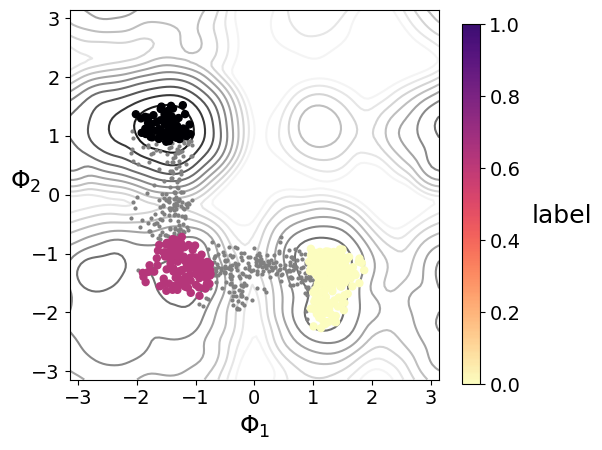

In [362]:
fig, ax = plt.subplots(dpi=100)                  
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
ax.set_aspect('equal')
plt.plot(train_dataset[:][0][:,0],train_dataset[:][0][:,1],'o', color='gray',linewidth=1, markersize=2)
ndx=np.where((train_dataset[:][1]!=2.0))[0]
plt.scatter(train_dataset[:][0][ndx,0],train_dataset[:][0][ndx,1],c=train_dataset[:][1][ndx],s=25,cmap='magma_r',zorder=20)
cbar = plt.colorbar(pp, ax=ax)
cbar.ax.set_position([0.78, 0.1, 0.05, 0.75])  
cbar.set_label(r'label', rotation=0, labelpad=30,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0)
plt.show()

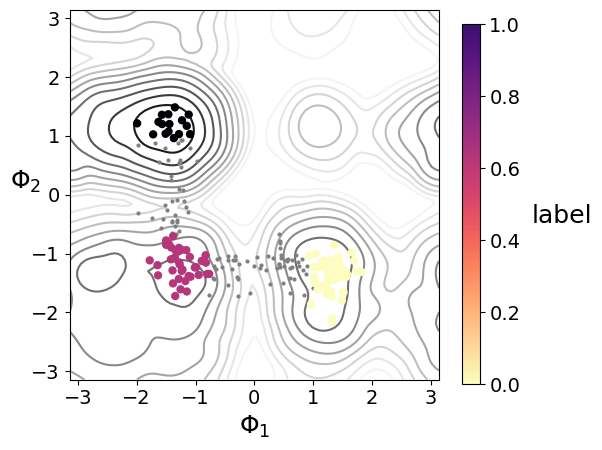

In [363]:
fig, ax = plt.subplots(dpi=100)                  
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
ax.set_aspect('equal')
plt.plot(val_dataset[:][0][:,0],val_dataset[:][0][:,1],'o', color='gray',linewidth=1, markersize=2)
ndx=np.where((val_dataset[:][1]!=2.0))[0]
plt.scatter(val_dataset[:][0][ndx,0],val_dataset[:][0][ndx,1],c=val_dataset[:][1][ndx],s=25,cmap='magma_r',zorder=20)
cbar = plt.colorbar(pp, ax=ax)
cbar.ax.set_position([0.78, 0.1, 0.05, 0.75])  
cbar.set_label(r'label', rotation=0, labelpad=30,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0)
plt.show()

In [364]:
class DeepLNE_CV(nn.Module):

    def __init__(self,
                ANN_layers: list,
                AutoEncoder_layers: list,
                f: int,
                d: int,
                n: int,
                ref: torch.Tensor,
                ref_z: torch.Tensor,
                act: str,
                z_lambda: float,
                device: str):
        

        super(DeepLNE_CV,self).__init__()
        
        # =======   LOSS  =======
        self.loss_mse = torch.nn.MSELoss()
        self.loss_ce = torch.nn.CrossEntropyLoss()
        

        # ======= BLOCKS =======
        
        self.n_features=f
        self.n_neighbors=n
        self.d_metric=d
        self.training_datapoints=ref
        self.training_datapoints_z=ref_z
        self.z_lambda=z_lambda
        
        self.device = torch.device(device)
        
        #print('Numer of input features:',self.n_features)
        #print('Numer of neighbors:',self.n_neighbors)
        #print('Dimension for nn search:',self.d_metric)
         
        if act == 'ReLU':
            self.activationf=torch.nn.ReLU()
        if act == 'Tanh':
            self.activationf=torch.nn.Tanh()
        if act == 'Sigmoid':
            self.activationf=torch.nn.Sigmoid()
        if act == 'ELU':
            self.activationf=torch.nn.ELU()
        if act == 'Softplus':    
            self.activationf=torch.nn.Softplus()
            
        self.ANNlayers = []
        
        self.ANNlayers.append(torch.nn.Linear(self.n_features, ANN_layers[0]))
        self.ANNlayers.append(self.activationf)
        
        for i in range(len(ANN_layers) - 1):
            self.ANNlayers.append(torch.nn.Linear(ANN_layers[i], ANN_layers[i + 1]))
            self.ANNlayers.append(self.activationf)

        self.ANNlayers.append(torch.nn.Linear(ANN_layers[-1], self.d_metric))
        
        self.metric = torch.nn.Sequential(*self.ANNlayers).to(self.device)
        #print('ANN architecture: ',self.metric)
            

        # initialize encoder
        self.AutoEncoderLayers = []
        
        self.AutoEncoderLayers.append(torch.nn.Linear(int(self.n_neighbors*self.d_metric), AutoEncoder_layers[0]))
        self.AutoEncoderLayers.append(self.activationf)
        
        for i in range(len(AutoEncoder_layers) - 1):
            self.AutoEncoderLayers.append(torch.nn.Linear(AutoEncoder_layers[i], AutoEncoder_layers[i + 1]))
            self.AutoEncoderLayers.append(self.activationf)

        self.AutoEncoderLayers.append(torch.nn.Linear(AutoEncoder_layers[-1], 1))
        self.AutoEncoderLayers.append(torch.nn.Sigmoid())

        self.encoder = torch.nn.Sequential(*self.AutoEncoderLayers).to(self.device)
        #print('Encoder architecture: ',self.encoder)
        
        # initialize decoder
        self.AutoDecoderLayers = []
        AutoDecoder_layers=AutoEncoder_layers[::-1]
        
        self.AutoDecoderLayers.append(torch.nn.Linear(1, AutoDecoder_layers[0]))
        self.AutoDecoderLayers.append(self.activationf)
        
        for i in range(len(AutoDecoder_layers) - 1):
            self.AutoDecoderLayers.append(torch.nn.Linear(AutoDecoder_layers[i], AutoDecoder_layers[i + 1]))
            self.AutoDecoderLayers.append(self.activationf)

        self.AutoDecoderLayers.append(torch.nn.Linear(AutoDecoder_layers[-1], self.n_features))

        self.decoder = torch.nn.Sequential(*self.AutoDecoderLayers).to(self.device)
        #print('Decoder architecture: ',self.decoder)
    
    def softmax_w(self,x: torch.Tensor, t=1e-1) -> torch.Tensor:
        x = x / t
        x = x - torch.max(x, dim=1, keepdim=True)[0]
        return (torch.exp(x)+1e-6) / torch.sum(torch.exp(x), dim=1, keepdim=True)
        

    def soft_top_k(self,x: torch.Tensor,t: torch.Tensor) -> torch.Tensor:
        y = torch.zeros_like(x)
            
        for k in range(self.n_neighbors):
            y.fill_diagonal_(1)
            x_w = x * (1 - y)
            x_w_softmax = self.softmax_w(x_w)
            y = y+x_w_softmax
            
            dm=torch.matmul(t.T,x_w_softmax.T)
            
            if k == 0:
                dn=dm
            else:
                dn=torch.cat((dn,dm))
        return dn.T

    def learn_metric(self,x: torch.Tensor) -> torch.Tensor:
        d=self.metric(x)
        t=self.metric(self.training_datapoints)
        return d,t
    
    def find_nearest_neighbors(self,x: torch.Tensor,t: torch.Tensor) -> torch.Tensor:
        
        dist = torch.cdist(x, t)
        dist=torch.exp(-dist)
        dn = self.soft_top_k(dist,t)
        
        return dn
        
    def encode(self,x: torch.Tensor) -> torch.Tensor:
        x=self.encoder(x)
        return x
    
    def decode(self,x: torch.Tensor) -> torch.Tensor:
        x=self.decoder(x)
        return x
    
    def encode_decode(self, x: torch.Tensor) -> torch.Tensor:
        d,t=self.learn_metric(x)
        dn=self.find_nearest_neighbors(d,t)
        
        s=self.encode(dn)
        x_hat=self.decode(s) 
        
        return x_hat,s,d,dn
    
    def forward(self, x: torch.Tensor) -> torch.Tensor :
        d,t=self.learn_metric(x)
        dn=self.find_nearest_neighbors(d,t)
        s=self.encode(dn).reshape(-1,1)
        z=self.compute_z(x[:,:2]).reshape(-1,1) #self.compute_z(d).reshape(-1,1)
        
        out=torch.hstack((s,z))
        
        return out
    
    def compute_z(self,x: torch.Tensor) -> torch.Tensor:
        z_dist=torch.cdist(x,self.training_datapoints_z[:,:2])
        z_dist=torch.absolute(z_dist)
        z=(-1/self.z_lambda)*torch.log(torch.sum(torch.exp(-self.z_lambda*z_dist),axis=1))

        return z

In [365]:
device = torch.device("cuda") #("cpu") #("cuda")

training_datapoints=torch.Tensor(training_datapoints).to(device)
model_datapoints=torch.Tensor(model_datapoints).to(device)

ANN_architecture=[3]
AutoEncoder_architecture=[2]

n_features=6
d_metric=3
n_neighbors=3 
l=10

model = DeepLNE_CV(ANN_layers=ANN_architecture,
                   AutoEncoder_layers=AutoEncoder_architecture,
                   f=n_features,
                   d=d_metric,
                   n=n_neighbors,
                   ref=model_datapoints,
                   ref_z=model_datapoints,
                   act='Tanh',
                   z_lambda=l,
                   device=device)

optimizer = optim.Adam(model.parameters(), lr=0.001)

In [30]:
alpha=1e0
beta=1e-4


track_train = []
track_val = []
best_val_loss = float('inf') 

num_epochs = 5001
for epoch in range(num_epochs):
    train_loss = 0.0
    model.train()  # Set the model to training mode
    for batch_idx, (features, labels) in enumerate(train_loader):
        # Prepare input and target data
        x = features.to(device)  
        l = labels.to(device) 
        
        # Forward Pass
        x_hat,s,d,dn = model.encode_decode(x)

        # Compute Loss
        #selective reconstruction
        reconstruction_loss = model.loss_mse(x_hat[:,:2], x[:,:2])
        
        ndx=torch.where(l!=2)[0]
        if len(ndx) > 0:
            multitask_loss = model.loss_mse(s.flatten()[ndx], l[ndx])
        else:
            multitask_loss = 0.0
        loss=reconstruction_loss+alpha*multitask_loss
        
        #L2 regularization
        for param in model.parameters():
            loss += beta * torch.norm(param, 2)

        # Backward Pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * x.size(0)

    train_loss = train_loss / batch_idx
    track_train.append(train_loss)
    
    # Validation phase
    model.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    with torch.no_grad():
        
        val_x = val_features.to(device)
        val_l = val_labels.to(device)

        # Forward Pass
        x_hat,s,d,dn = model.encode_decode(val_x)

        # Compute Loss
        #selective reconstrction
        reconstruction_loss = model.loss_mse(x_hat[:,:2], val_x[:,:2])
        
        ndx=torch.where(val_l!=2)[0]
        if len(ndx) > 0:
            multitask_loss = model.loss_mse(s.flatten()[ndx], val_l[ndx])
        else:
            multitask_loss = 0.0
        loss=reconstruction_loss+alpha*multitask_loss
        
    val_loss += loss.item() * val_x.size(0)

    track_val.append(val_loss)
    
    if epoch % 100 == 0:
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(epoch, train_loss, val_loss))

    # Save the best model based on validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), './DeepLNE_3states/model_teacher.pt')

    # Break early if necessary
    if train_loss < 1e-5:
        print(f"Converged at epoch {epoch}")
        break


Epoch: 0 	Training Loss: 125.670050 	Validation Loss: 367.568612
Epoch: 100 	Training Loss: 47.554565 	Validation Loss: 133.396888
Epoch: 200 	Training Loss: 9.070011 	Validation Loss: 23.296459
Epoch: 300 	Training Loss: 4.959458 	Validation Loss: 12.689409
Epoch: 400 	Training Loss: 3.343253 	Validation Loss: 8.958151
Epoch: 500 	Training Loss: 3.178328 	Validation Loss: 8.681646
Epoch: 600 	Training Loss: 3.156930 	Validation Loss: 8.611670
Epoch: 700 	Training Loss: 3.125187 	Validation Loss: 8.489369
Epoch: 800 	Training Loss: 3.103357 	Validation Loss: 8.403531
Epoch: 900 	Training Loss: 3.098107 	Validation Loss: 8.350073
Epoch: 1000 	Training Loss: 3.083605 	Validation Loss: 8.309436
Epoch: 1100 	Training Loss: 3.068047 	Validation Loss: 8.254123
Epoch: 1200 	Training Loss: 3.064468 	Validation Loss: 8.235793
Epoch: 1300 	Training Loss: 3.059693 	Validation Loss: 8.273515
Epoch: 1400 	Training Loss: 3.052987 	Validation Loss: 8.172899
Epoch: 1500 	Training Loss: 3.048215 	Valid

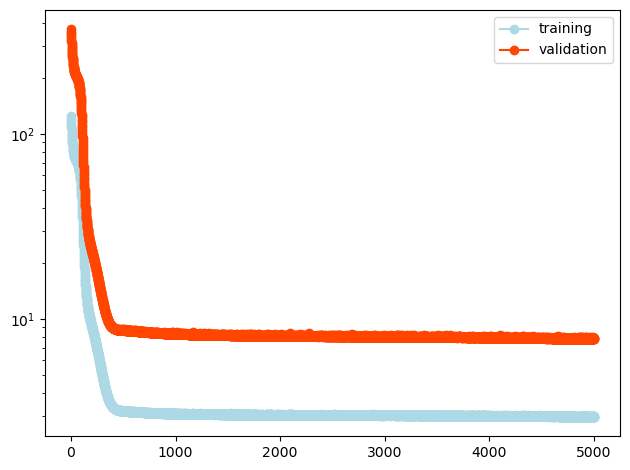

In [31]:
plt.figure()
plt.plot(track_train,'o-',color='lightblue',label='training')
plt.plot(track_val,'o-',color='orangered',label='validation')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

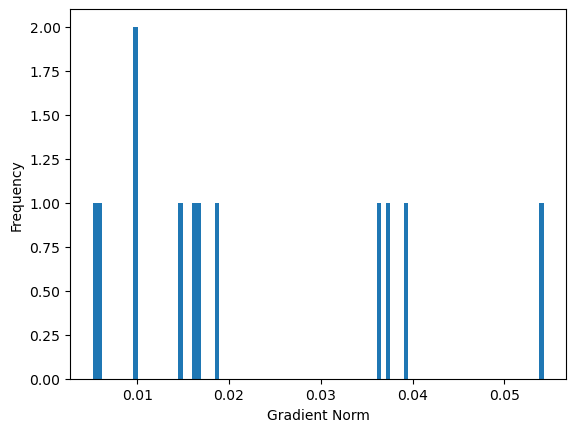

In [32]:
norms = []
for param in model.parameters():
    if param.grad is not None:
        norms.append(param.grad.norm().item())
plt.hist(norms, bins=100)
plt.xlabel('Gradient Norm')
plt.ylabel('Frequency')
plt.show()

In [366]:
device = torch.device("cpu")

training_datapoints=torch.Tensor(training_datapoints).to(device)
model_datapoints=torch.Tensor(model_datapoints).to(device)

ANN_architecture=[3]
AutoEncoder_architecture=[2] 

model = DeepLNE_CV(ANN_layers=ANN_architecture,
                   AutoEncoder_layers=AutoEncoder_architecture,
                   f=n_features,
                   d=d_metric,
                   n=n_neighbors,
                   ref=model_datapoints,
                   ref_z=model_datapoints,
                   act='Tanh',
                   z_lambda=l,
                   device=device)

model.load_state_dict(torch.load('./DeepLNE_3states/model_teacher.pt'), strict=False)
model_datapoints_z=model.encode_decode(model_datapoints)[0].detach().numpy()

training_datapoints=torch.Tensor(training_datapoints)
model_datapoints=torch.Tensor(model_datapoints)
model_datapoints_z=torch.Tensor(model_datapoints_z)

ANN_architecture=[3]
AutoEncoder_architecture=[2] 

n_features=6
d_metric=3
n_neighbors=3
l=10 

plumed_model = DeepLNE_CV(ANN_layers=ANN_architecture,
                   AutoEncoder_layers=AutoEncoder_architecture,
                   f=n_features,
                   d=d_metric,
                   n=n_neighbors,
                   ref=model_datapoints,
                   ref_z=model_datapoints_z,
                   act='Tanh',
                   z_lambda=l,
                   device=device)

plumed_model.load_state_dict(torch.load('./DeepLNE_3states/model_teacher.pt'), strict=False)

<All keys matched successfully>

In [896]:
m=torch.jit.trace(plumed_model,torch.ones(1,n_features))
m.save('./DeepLNE_3states/model_teacher.ptc')

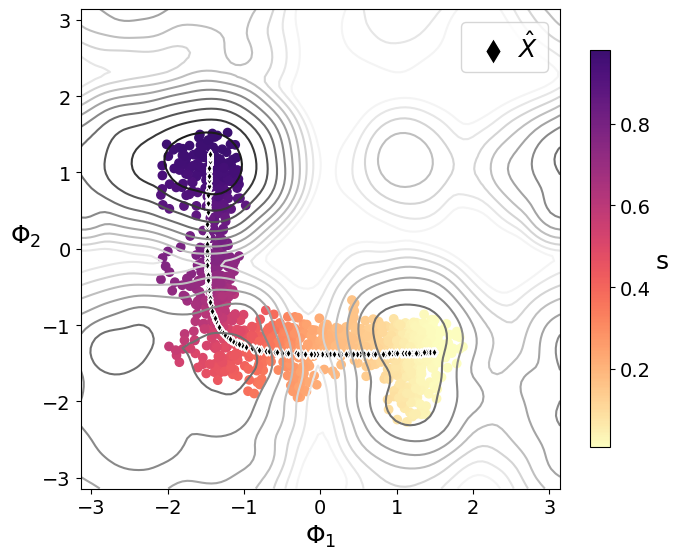

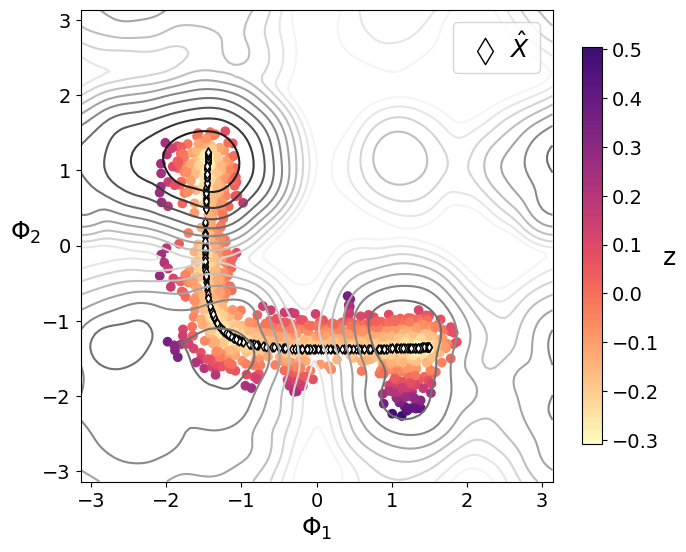

In [367]:
import matplotlib.colors as mcolors

input=model_datapoints
x_hat,s,d,dn=plumed_model.encode_decode(input)
x_hat=x_hat.detach().numpy()


input=training_datapoints
out=plumed_model(input)
s = out[:,0]
z = out[:,1]
s=s.detach().numpy()
z=z.detach().numpy()


magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256)))  


fig, ax = plt.subplots(1, figsize=(7,7))
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
contour2=plt.scatter(training_datapoints[:,0],training_datapoints[:,1],c=s[:],cmap=new_magma)
plt.scatter(x_hat[:,0], x_hat[:,1],color='black', s=20, marker='d',edgecolors='white',label=r'$\hat{X}$')

cbar = plt.colorbar(contour2,ax=ax, shrink=0.6)
cbar.set_label(r's', rotation=0, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0,labelpad=12)
ax.set_aspect('equal')
legend = plt.legend(loc='upper right', fontsize=18, markerscale=3, handlelength=1.75, handletextpad=0.1)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, figsize=(7,7))
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
contour2=plt.scatter(training_datapoints[:,0],training_datapoints[:,1],c=z[:],cmap=new_magma)
plt.scatter(x_hat[:,0], x_hat[:,1],color='white', s=20, marker='d',edgecolors='black',label=r'$\hat{X}$')

cbar = plt.colorbar(contour2,ax=ax, shrink=0.6)
cbar.set_label(r'z', rotation=0, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0,labelpad=12)
ax.set_aspect('equal')
legend = plt.legend(loc='upper right', fontsize=18, markerscale=3, handlelength=1.75, handletextpad=0.1)
plt.tight_layout()
plt.show()

In [36]:
import plotly.graph_objects as go


fig = go.Figure(data=go.Scatter3d(
    x=training_datapoints[:,0],
    y=training_datapoints[:,1],
    z=training_datapoints[:,2],
    mode='markers',
    marker=dict(
        size=5,
        color=s,            
        colorscale='electric',  
        opacity=0.2,
        colorbar=dict(title=r's')
    )
))

fig.update_layout(
    scene=dict(
        xaxis=dict(backgroundcolor='#CCCCCC'),
        yaxis=dict(backgroundcolor='#CCCCCC'),
        zaxis=dict(backgroundcolor='#CCCCCC', gridcolor='rgba(0, 0, 0, 0)')
    )
)

fig.add_trace(go.Scatter3d(
    x=x_hat[:,0],
    y=x_hat[:,1],
    z=x_hat[:,2],
    mode='markers',
    marker=dict(
        size=10,
        opacity=1
    ),
    name='xhat'
))



# Update layout for axis labels and title
fig.update_layout(
    scene=dict(
        xaxis=dict(title=r'ϕ1'),
        yaxis=dict(title=r'ϕ2'),
        zaxis=dict(title=r'ϕ3')
    )
)

fig.show()


In [37]:
import plotly.graph_objects as go


# Create the scatter plot
fig = go.Figure(data=go.Scatter3d(
    x=training_datapoints[:,0],
    y=training_datapoints[:,1],
    z=training_datapoints[:,2],
    mode='markers',
    marker=dict(
        size=5,
        color=z,            
        colorscale='electric',  
        opacity=0.2,
        colorbar=dict(title=r'z')
    )
))

fig.update_layout(
    scene=dict(
        xaxis=dict(backgroundcolor='#CCCCCC'),
        yaxis=dict(backgroundcolor='#CCCCCC'),
        zaxis=dict(backgroundcolor='#CCCCCC', gridcolor='rgba(0, 0, 0, 0)')
    )
)

fig.add_trace(go.Scatter3d(
    x=x_hat[:,0],
    y=x_hat[:,1],
    z=x_hat[:,2],
    mode='markers',
    marker=dict(
        size=10,
        opacity=1
    ),
    name='xhat'
))



# Update layout for axis labels and title
fig.update_layout(
    scene=dict(
        xaxis=dict(title=r'ϕ1'),
        yaxis=dict(title=r'ϕ2'),
        zaxis=dict(title=r'ϕ3')
    )
)

fig.show()


torch.Size([4096, 2])
torch.Size([4096, 4])
torch.Size([4096, 6])


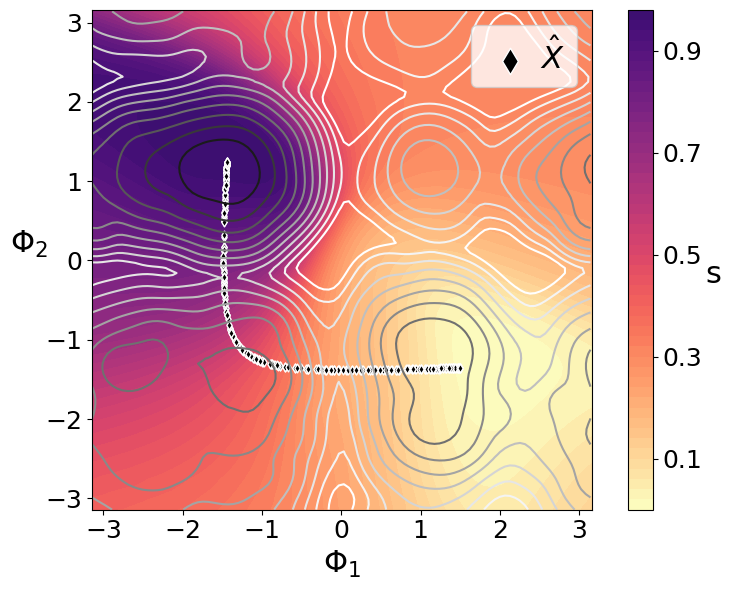

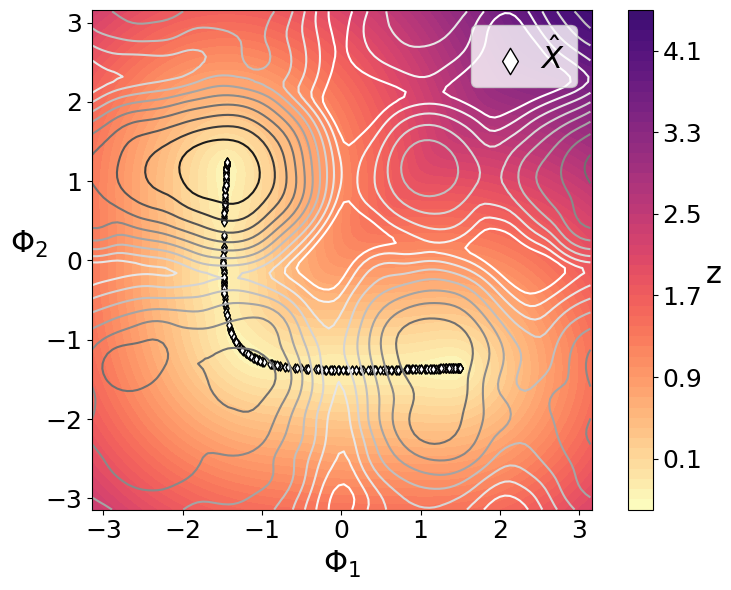

In [29]:
import matplotlib.colors as mcolors

input=model_datapoints
x_hat,s,d,dn=plumed_model.encode_decode(input)
x_hat=x_hat.detach().numpy()

x_range = np.arange(-np.pi, np.pi+0.05, 0.1)
y_range = np.arange(-np.pi, np.pi+0.05, 0.1)

x_grid, y_grid = np.meshgrid(x_range, y_range)

grid_points = np.column_stack((x_grid.flatten(), y_grid.flatten()))

sample_grid=torch.Tensor(grid_points)
fill=torch.zeros(sample_grid.shape[0],4)
print(sample_grid.shape)
print(fill.shape)

input=torch.hstack((sample_grid,fill))
print(input.shape)
out=plumed_model(input)
s = out[:,0]
z = out[:,1]
s=s.detach().numpy()
z=z.detach().numpy()


grid_x = grid_points[:, 0].reshape(x_grid.shape)  
grid_y = grid_points[:, 1].reshape(x_grid.shape)  
grid_s = s.reshape(x_grid.shape)  
grid_z = z.reshape(x_grid.shape)  

magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256)))  


fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
contour2 = ax.contourf(grid_x,grid_y,grid_s,50,cmap=new_magma)
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
plt.scatter(x_hat[:,0], x_hat[:,1],color='black', s=20, marker='d',edgecolors='white',label=r'$\hat{X}$')
cbar = plt.colorbar(contour2,ax=ax)
cbar.set_label(r's', rotation=0, labelpad=8,fontsize=22)
cbar.set_ticks(np.arange(0.1, 1, 0.2))
cbar.ax.tick_params(labelsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(r'$\Phi_1$',fontsize=22)
plt.ylabel(r'$\Phi_2$',fontsize=22,rotation=0,labelpad=12)
ax.set_aspect('equal')
legend = plt.legend(loc='upper right', fontsize=22, markerscale=3, handlelength=1.75, handletextpad=0.1)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
contour2 = ax.contourf(grid_x,grid_y,grid_z,50,cmap=new_magma)
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
plt.scatter(x_hat[:,0], x_hat[:,1],color='white', s=20, marker='d',edgecolors='black',label=r'$\hat{X}$')
cbar = plt.colorbar(contour2,ax=ax)
cbar.set_label(r'z', rotation=0, labelpad=8,fontsize=22)
cbar.set_ticks(np.arange(0.1, 4.5,0.8))
cbar.ax.tick_params(labelsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(r'$\Phi_1$',fontsize=22)
plt.ylabel(r'$\Phi_2$',fontsize=22,rotation=0,labelpad=12)
ax.set_aspect('equal')
legend = plt.legend(loc='upper right', fontsize=22, markerscale=3, handlelength=1.75, handletextpad=0.1)
plt.tight_layout()
plt.show()

torch.Size([4096, 2])
torch.Size([4096, 4])
torch.Size([4096, 6])


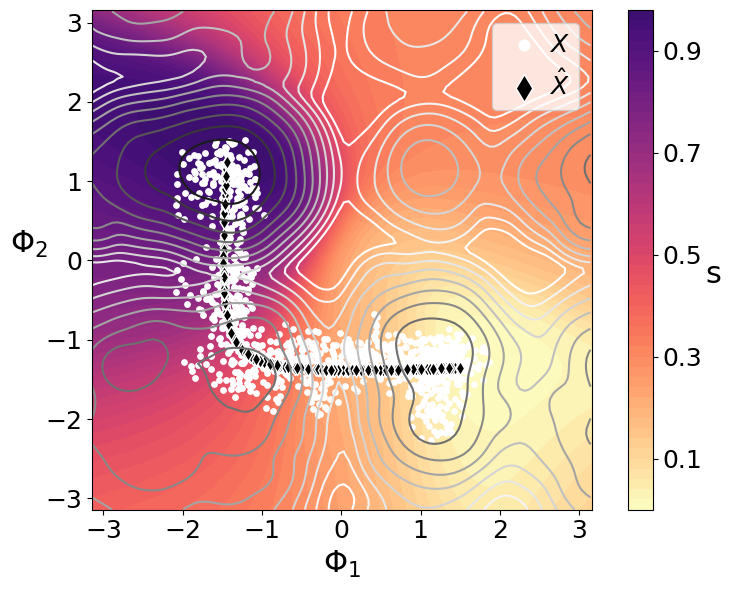

<Figure size 640x480 with 0 Axes>

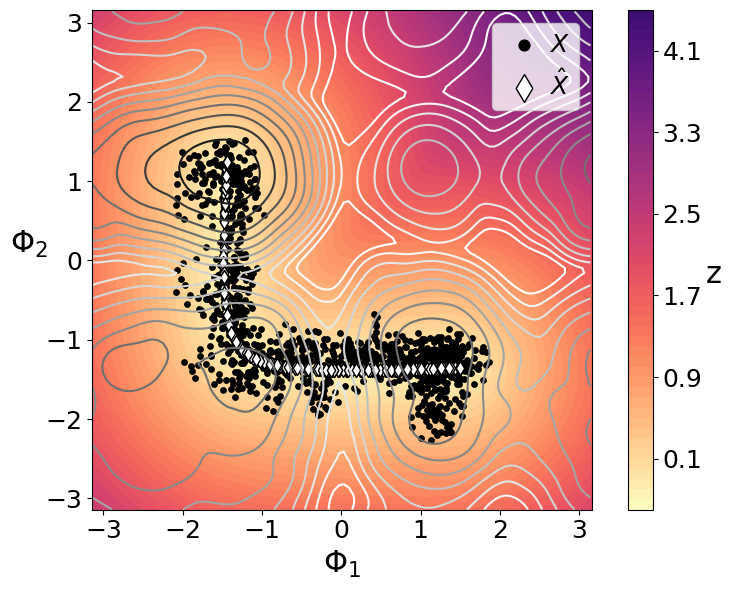

<Figure size 640x480 with 0 Axes>

In [368]:
import matplotlib.colors as mcolors

input=model_datapoints
x_hat,s,d,dn=plumed_model.encode_decode(input)
x_hat=x_hat.detach().numpy()

x_range = np.arange(-np.pi, np.pi+0.05, 0.1)
y_range = np.arange(-np.pi, np.pi+0.05, 0.1)

x_grid, y_grid = np.meshgrid(x_range, y_range)

grid_points = np.column_stack((x_grid.flatten(), y_grid.flatten()))

sample_grid=torch.Tensor(grid_points)
fill=torch.zeros(sample_grid.shape[0],4)
print(sample_grid.shape)
print(fill.shape)

input=torch.hstack((sample_grid,fill))
print(input.shape)
out=plumed_model(input)
s = out[:,0]
z = out[:,1]
s=s.detach().numpy()
z=z.detach().numpy()

grid_x = grid_points[:, 0].reshape(x_grid.shape)  
grid_y = grid_points[:, 1].reshape(x_grid.shape)  
grid_s = s.reshape(x_grid.shape)  
grid_z = z.reshape(x_grid.shape)  

magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256))) 


fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
contour2 = ax.contourf(grid_x,grid_y,grid_s,50,cmap=new_magma)
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
plt.scatter(training_datapoints.detach().numpy()[:,0], training_datapoints.detach().numpy()[:,1],color='white', s=15, marker='o',label=r'$X$')
plt.scatter(x_hat[:,0], x_hat[:,1],color='black', s=50, marker='d',edgecolors='white',label=r'$\hat{X}$')
cbar = plt.colorbar(contour2,ax=ax)
cbar.set_label(r's', rotation=0, labelpad=8,fontsize=22)
cbar.set_ticks(np.arange(0.1, 1,0.2))
cbar.ax.tick_params(labelsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(r'$\Phi_1$',fontsize=22)
plt.ylabel(r'$\Phi_2$',fontsize=22,rotation=0,labelpad=12)
ax.set_aspect('equal')
legend = plt.legend(loc='upper right', fontsize=18, markerscale=2, handlelength=1.75, handletextpad=0.1)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
contour2 = ax.contourf(grid_x,grid_y,grid_z,50,cmap=new_magma)
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')

plt.scatter(training_datapoints.detach().numpy()[:,0], training_datapoints.detach().numpy()[:,1],color='black', s=15, marker='o',label=r'$X$')
plt.scatter(x_hat[:,0], x_hat[:,1],color='white', s=50, marker='d',edgecolors='black',label=r'$\hat{X}$')
cbar = plt.colorbar(contour2,ax=ax)
cbar.set_label(r'z', rotation=0, labelpad=8,fontsize=22)
cbar.set_ticks(np.arange(0.1, 4.5,0.8))
cbar.ax.tick_params(labelsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(r'$\Phi_1$',fontsize=22)
plt.ylabel(r'$\Phi_2$',fontsize=22,rotation=0,labelpad=12)
ax.set_aspect('equal')
legend = plt.legend(loc='upper right', fontsize=18, markerscale=2, handlelength=1.75, handletextpad=0.1)
plt.tight_layout()
plt.show()

In [40]:
#reinforcement learning step
#perform a short OPES using PYTORCH DeepLNE

In [41]:
%%bash 
cat > DeepLNE_3states/Production.mdp << EOF
; RUN PARAMETERS
integrator               = md
dt                       = 0.002
nsteps                   = 500000000               ;number of steps 1000000ps 1ms
nstxout                  = 500000                     ; high precision every 0.1ps
nstvout                  =     
nstlog                   = 500000
nstenergy                = 500000
nstxtcout                = 500000
xtc_grps                 = System     ;group(s) to write to xtc trajectory
energygrps               = System       ;group(s) to write to energy file 
                                                
;NEIGHBORING SEARCHING PARAMETERS
nstlist                  = 10                   ;Frequency to update the neighbor list (and the long-range forces, 
ns_type                  = Grid                 ;Make a grid in the box and only check atoms in neighboring grid cells 
                                                ;when constructing a new neighbor list every nstlist steps                                      
pbc                      = xyz                  ; Periodic boudary conditions in all the directions 
rlist                    = 1.0

;OPTIONS FOR ELECTROSTATICS AND VDW
cutoff-scheme            = Verlet
coulombtype              = PME 
pme_order                = 4                     ;cubic interpolation
fourierspacing           = 0.12 
rcoulomb                 = 1.0
vdw-type                 = Cut-off
rvdw                     = 1.0


;TEMPERATURE COUPLING
tcoupl                   = v-rescale            ;Temperature coupling
tc-grps                  = System
tau_t                    = 0.1
ref_t                    = 300

;DISPERSION CORRECTION
DispCorr                 = EnerPres             ; account for vdw cut-off

;PRESSURE COUPLING
Pcoupl                   = no                   ;NVT simulation

continuation             = yes
gen_vel                  = no                   ;Velocity generation
gen_temp                 = 300
gen_seed                 = -1

;OPTIONS FOR BONDS
lincs_iter               = 1
lincs_order              = 4
constraints              = h-bonds
EOF

In [42]:
%%bash 
gmx_mpi grompp -f DeepLNE_3states/Production.mdp -c ABMD_2Levels/stateA2.pdb -p topol.top -n index.ndx -o DeepLNE_3states/MD.tpr 

             :-) GROMACS - gmx grompp, 2022.5-plumed_2.10.0_dev (-:

Executable:   /home/rizziv@farma.unige.ch/programs/gromacs-2022.5/install_single_cuda/bin/gmx_mpi
Data prefix:  /home/rizziv@farma.unige.ch/programs/gromacs-2022.5/install_single_cuda
Working dir:  /home/frohlkin@farma.unige.ch/Projects/TransitionPathSampling_DeepLNE/Publication_Toymodels/Trialanine
Command line:
  gmx_mpi grompp -f DeepLNE_3states/Production.mdp -c ABMD_2Levels/stateA2.pdb -p topol.top -n index.ndx -o DeepLNE_3states/MD.tpr

Ignoring obsolete mdp entry 'ns_type'
Replacing old mdp entry 'nstxtcout' by 'nstxout-compressed'
Replacing old mdp entry 'xtc_grps' by 'compressed-x-grps'
Generating 1-4 interactions: fudge = 0.5
Number of degrees of freedom in T-Coupling group System is 101.00

NOTE 1 [file DeepLNE_3states/Production.mdp]:
  The optimal PME mesh load for parallel simulations is below 0.5
  and for highly parallel simulations between 0.25 and 0.33,
  for higher performance, increase the cut-off 

Setting the LD random seed to -545652897

Generated 3485 of the 3486 non-bonded parameter combinations

Generated 3486 of the 3486 1-4 parameter combinations

Excluding 3 bonded neighbours molecule type 'Protein'

turning H bonds into constraints...

The largest distance between excluded atoms is 0.397 nm

Determining Verlet buffer for a tolerance of 0.005 kJ/mol/ps at 300 K

Calculated rlist for 1x1 atom pair-list as 1.000 nm, buffer size 0.000 nm

Set rlist, assuming 4x4 atom pair-list, to 1.000 nm, buffer size 0.000 nm

Note that mdrun will redetermine rlist based on the actual pair-list setup
Calculating fourier grid dimensions for X Y Z
Using a fourier grid of 28x28x28, spacing 0.110 0.110 0.110

Estimate for the relative computational load of the PME mesh part: 0.95

This run will generate roughly 5 Mb of data


In [43]:
lines=[]
lines.append('MOLINFO STRUCTURE=molinfo_trialanine.pdb\n')

features=[]
lines.append('phi1: TORSION ATOMS=@phi-2\n')
lines.append('phi2: TORSION ATOMS=@phi-3\n')
lines.append('phi3: TORSION ATOMS=@phi-4\n')
lines.append('psi1: TORSION ATOMS=@psi-2\n')
lines.append('psi2: TORSION ATOMS=@psi-3\n')
lines.append('psi3: TORSION ATOMS=@psi-4\n')

lines.append('ene: ENERGY\n')

features.append('phi1')
features.append('phi2')
features.append('phi3')
features.append('psi1')
features.append('psi2')
features.append('psi3')



features = ','.join(features)
lines.append('model: PYTORCH_MODEL FILE=model_teacher.ptc ARG=%s \n' %features)

lines.append('OPES_METAD_EXPLORE ...\n')
lines.append('  LABEL=opes\n')
lines.append('  ARG=model.node-0\n')
lines.append('  FILE=Kernels.data\n')
lines.append('  STATE_RFILE=compressed.Kernels\n')
lines.append('  STATE_WFILE=compressed.Kernels\n')
lines.append('  PACE=500\n')
lines.append('  BARRIER=80\n')
lines.append('... OPES_METAD_EXPLORE\n')

lines.append('uwall_z: UPPER_WALLS ARG=model.node-1 KAPPA=500 AT=0.2\n')

lines.append('PRINT STRIDE=250 FILE=COLVAR ARG=* FMT=%7.4f\n')

lines.append('ENDPLUMED\n')

f = open("DeepLNE_3states/plumed.dat", "w")
for elem in lines:
    f.writelines(elem)
f.close()

In [44]:
!scp molinfo_trialanine.pdb DeepLNE_3states/

In [45]:
2500000/250

10000.0

In [46]:
%%bash 
cat > DeepLNE_3states/run.sh << EOF
export OMP_NUM_THREADS=1
mpirun -n 1 gmx_mpi mdrun -deffnm MD -plumed plumed.dat -pin on -pinoffset 0 -notunepme -nsteps 2500000 -nb gpu &
EOF

In [185]:
!find . -type f -name "#*" -exec rm -rf {} +
!find . -type f -name "step*" -exec rm -rf {} +
!find . -type f -name "bck*" -exec rm -rf {} +

In [369]:
colvar=plumed.read_as_pandas("DeepLNE_3states/COLVAR")
colvar

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


,time,phi1,phi2,phi3,psi1,psi2,psi3,ene,model.node-0,model.node-1,opes.bias,opes.rct,opes.zed,opes.neff,opes.nker,uwall_z.bias,uwall_z.force2
0,0.0,1.4538,-1.1037,1.0272,-1.2644,2.4749,-0.7364,-785.1878,0.0161,0.2073,-80.0000,-80.0000,1.0000,1.0000,0.0,0.0264,52.7346
1,0.5,1.0470,-1.2597,1.1700,-0.4967,1.9288,-0.7458,-762.1956,0.0665,0.0820,-80.0000,-80.0000,1.0000,1.0000,0.0,0.0000,0.0000
2,1.0,1.1778,-1.2909,1.1311,-0.6778,1.0911,-1.2633,-764.4412,0.0449,0.0465,-80.0000,-80.0000,1.0000,1.0000,0.0,0.0000,0.0000
3,1.5,0.9313,-1.2656,0.9268,-1.8595,0.8333,-0.7449,-788.1268,0.0848,0.0817,-80.0000,-80.0000,1.0000,1.0000,0.0,0.0000,0.0000
4,2.0,1.3659,-1.5429,1.0587,-0.8889,1.3980,-0.8454,-788.4586,0.0269,0.1447,-80.0000,-80.0000,1.0000,1.0000,0.0,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,4998.0,-1.0985,1.2842,-2.4753,2.4124,0.8544,3.0690,-731.5149,0.9679,0.3164,17.0199,92.9159,0.4259,23.9141,8.0,6.7740,13547.9867
9997,4998.5,-1.4584,1.5813,-1.9034,2.7694,0.5850,2.4640,-738.3444,0.9789,0.3183,11.6196,92.9159,0.4259,23.9141,8.0,6.9949,13989.7240
9998,4999.0,-1.4890,1.5086,-2.9710,2.6026,1.3307,2.5476,-681.6994,0.9750,0.2488,13.7143,92.9154,0.4258,23.9141,8.0,1.1916,2383.2097
9999,4999.5,-1.4823,1.5229,-2.7408,2.6675,0.3944,2.6668,-710.4608,0.9770,0.2621,12.7578,92.9154,0.4258,23.9141,8.0,1.9255,3850.9426


In [370]:
data_reinforcement=colvar.iloc[:,1:10].to_numpy()

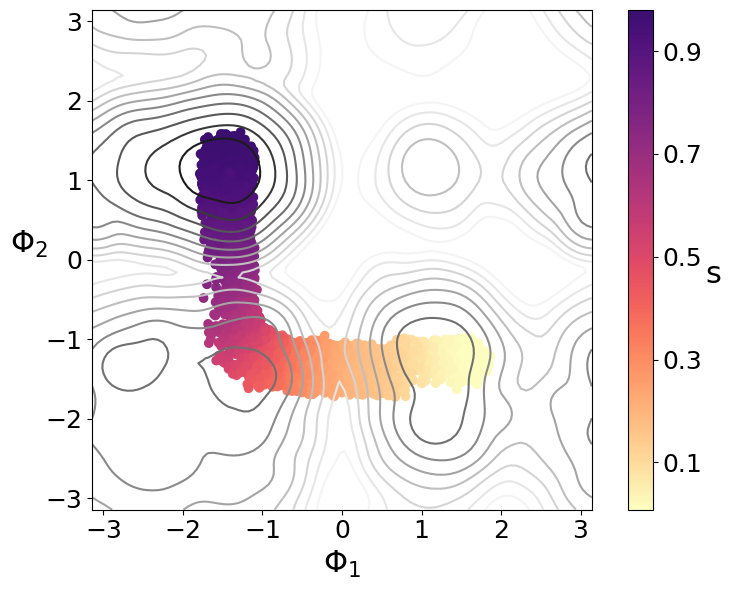

<Figure size 640x480 with 0 Axes>

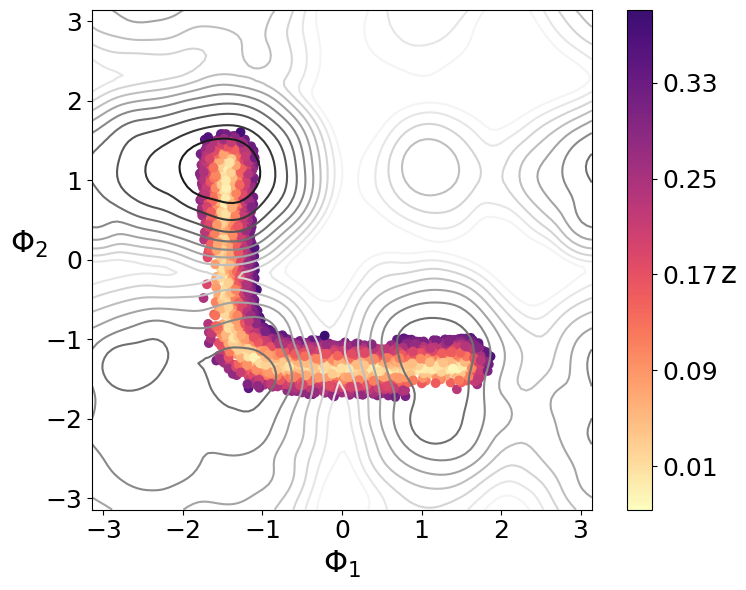

<Figure size 640x480 with 0 Axes>

In [371]:
import matplotlib.colors as mcolors

magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256)))  


fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
contour2=plt.scatter(data_reinforcement[:,0],data_reinforcement[:,1],c=data_reinforcement[:,7],cmap=new_magma)

cbar = plt.colorbar(contour2,ax=ax)
cbar.set_label(r's', rotation=0, labelpad=8,fontsize=22)
cbar.set_ticks(np.arange(0.1, 1,0.2))
cbar.ax.tick_params(labelsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(r'$\Phi_1$',fontsize=22)
plt.ylabel(r'$\Phi_2$',fontsize=22,rotation=0,labelpad=12)
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
contour2=plt.scatter(data_reinforcement[:,0],data_reinforcement[:,1],c=data_reinforcement[:,8],cmap=new_magma)

cbar = plt.colorbar(contour2,ax=ax)
cbar.set_label(r'z', rotation=0, labelpad=8,fontsize=22)
cbar.set_ticks(np.arange(0.01, 0.4, 0.08))
cbar.ax.tick_params(labelsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(r'$\Phi_1$',fontsize=22)
plt.ylabel(r'$\Phi_2$',fontsize=22,rotation=0,labelpad=12)
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

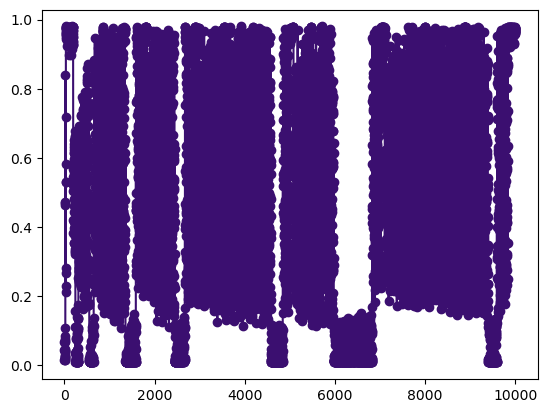

In [25]:
magma = plt.colormaps["magma_r"]
norm = mcolors.Normalize(vmin=0, vmax=10)

plt.plot(colvar['model.node-0'],'o-',color=magma(norm(8)))

In [190]:
import plotly.graph_objects as go

skip=1 

time=colvar['model.node-0'].to_numpy()[::skip]
phi1=colvar['phi1'].to_numpy()[::skip]
phi2=colvar['phi2'].to_numpy()[::skip]
phi3=colvar['phi3'].to_numpy()[::skip]


print(phi1.shape)
print(phi2.shape)
print(phi3.shape)
fig = go.Figure(data=go.Scatter3d(
    x=phi1,
    y=phi2,
    z=phi3,
    mode='markers',
    marker=dict(
        size=5,
        color=time,            
        colorscale='electric',  
        opacity=0.2,
        colorbar=dict(title=r'time')
    )
))

fig.update_layout(
    scene=dict(
        xaxis=dict(backgroundcolor='#CCCCCC'),
        yaxis=dict(backgroundcolor='#CCCCCC'),
        zaxis=dict(backgroundcolor='#CCCCCC', gridcolor='rgba(0, 0, 0, 0)')
    )
)

fig.update_layout(
    scene=dict(
        xaxis=dict(title=r'ϕ1'),
        yaxis=dict(title=r'ϕ2'),
        zaxis=dict(title=r'ϕ3')
    )
)

fig.show()


(7281,)
(7281,)
(7281,)


In [191]:
import plotly.graph_objects as go

skip=1 

time=colvar['model.node-1'].to_numpy()[::skip]
phi1=colvar['phi1'].to_numpy()[::skip]
phi2=colvar['phi2'].to_numpy()[::skip]
phi3=colvar['phi3'].to_numpy()[::skip]


print(phi1.shape)
print(phi2.shape)
print(phi3.shape)
fig = go.Figure(data=go.Scatter3d(
    x=phi1,
    y=phi2,
    z=phi3,
    mode='markers',
    marker=dict(
        size=5,
        color=time,            
        colorscale='electric',  
        opacity=0.2,
        colorbar=dict(title=r'time')
    )
))

fig.update_layout(
    scene=dict(
        xaxis=dict(backgroundcolor='#CCCCCC'),
        yaxis=dict(backgroundcolor='#CCCCCC'),
        zaxis=dict(backgroundcolor='#CCCCCC', gridcolor='rgba(0, 0, 0, 0)')
    )
)

fig.update_layout(
    scene=dict(
        xaxis=dict(title=r'ϕ1'),
        yaxis=dict(title=r'ϕ2'),
        zaxis=dict(title=r'ϕ3')
    )
)

fig.show()


(7281,)
(7281,)
(7281,)


In [58]:
colvar=plumed.read_as_pandas("DeepLNE_3states/COLVAR")
reinforcement_data=colvar.iloc[:,1:7].to_numpy()

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


(500, 6)


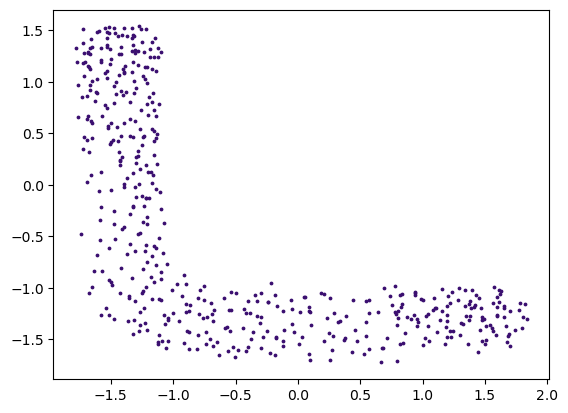

In [59]:
from skmatter.feature_selection import FPS

selector = FPS(n_to_select=500,initialize=0)

selector.fit(reinforcement_data[:,:3].T)
r_ndx=selector.selected_idx_
reinforcement_data_FPS = reinforcement_data[r_ndx]

print(reinforcement_data_FPS.shape)

plt.figure()
plt.scatter(reinforcement_data_FPS[:,0],reinforcement_data_FPS[:,1],color=magma(norm(8)),s=3,alpha=1)
plt.show()

In [60]:
student_training_datapoints=np.vstack((training_datapoints,reinforcement_data_FPS))
print(student_training_datapoints.shape)

(1500, 6)


In [61]:
device = torch.device("cpu")

ANN_architecture=[3]
AutoEncoder_architecture=[2] 

n_features=6
d_metric=3
n_neighbors=3
l=3.5e2

plumed_model = DeepLNE_CV(ANN_layers=ANN_architecture,
                   AutoEncoder_layers=AutoEncoder_architecture,
                   f=n_features,
                   d=d_metric,
                   n=n_neighbors,
                   ref=model_datapoints,
                   ref_z=model_datapoints_z,
                   act='Tanh',
                   z_lambda=l,
                   device=device)

plumed_model.load_state_dict(torch.load('./DeepLNE_3states/model_teacher.pt'), strict=False)

input_new=torch.Tensor(student_training_datapoints)

x_hat_new,s_new,d_new,dn_new = plumed_model.encode_decode(input_new)
x_hat_new=x_hat_new.detach().numpy()


out_new=plumed_model(input_new)
s_new = out_new[:,0]
z_new = out_new[:,1]
s_new=s_new.detach().numpy()
z_new=z_new.detach().numpy()

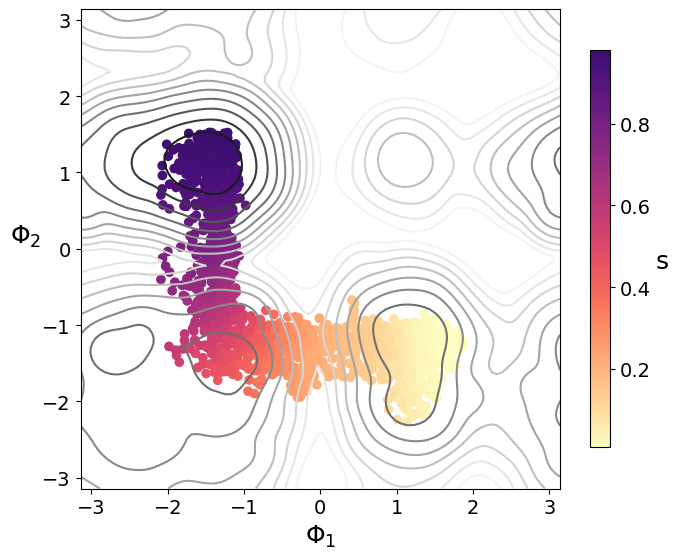

0.29508266


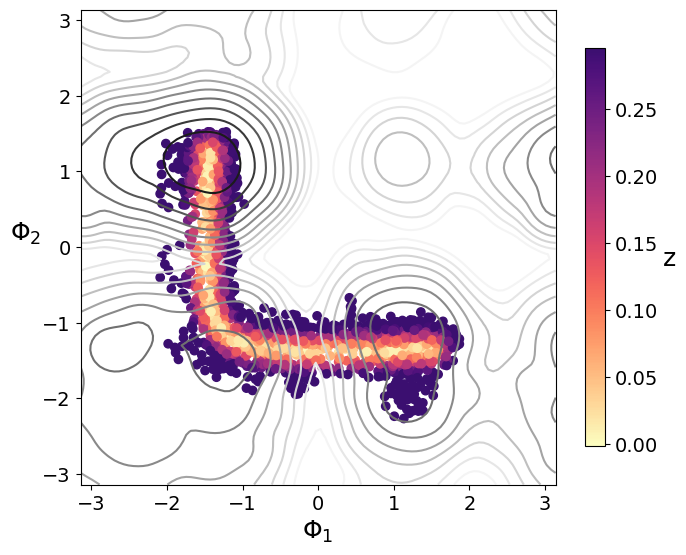

In [210]:
import matplotlib.colors as mcolors

magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256)))  


fig, ax = plt.subplots(1, figsize=(7,7))
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
contour2=plt.scatter(student_training_datapoints[:,0],student_training_datapoints[:,1],c=s_new,cmap=new_magma)

cbar = plt.colorbar(contour2,ax=ax, shrink=0.6)
cbar.set_label(r's', rotation=0, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0,labelpad=12)
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

ndx_inf = np.where(np.isinf(z_new))
ndx_nan = np.where(np.isnan(z_new))

max_val = np.nanmax(z_new[np.isfinite(z_new)])
print(max_val)

z_show=z_new
z_show[ndx_inf] = max_val
z_show[ndx_nan] = max_val

fig, ax = plt.subplots(1, figsize=(7,7))
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
contour2=plt.scatter(student_training_datapoints[:,0],student_training_datapoints[:,1],c=z_show,cmap=new_magma)

cbar = plt.colorbar(contour2,ax=ax, shrink=0.6)
cbar.set_label(r'z', rotation=0, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0,labelpad=12)
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

In [45]:
#train student model z

In [62]:
feature_data_student=torch.Tensor(student_training_datapoints)
label_data_student=torch.Tensor(z_new)

In [63]:
print(torch.isnan(feature_data_student))
print(torch.isnan(label_data_student))

tensor([[False, False, False, False, False, False],
        [False, False, False, False, False, False],
        [False, False, False, False, False, False],
        ...,
        [False, False, False, False, False, False],
        [False, False, False, False, False, False],
        [False, False, False, False, False, False]])
tensor([False, False, False,  ..., False, False, False])


In [64]:
filtered_arr = label_data_student.detach().numpy()
filtered_arr = filtered_arr[filtered_arr != np.inf]
np.max(filtered_arr)

0.29508266

In [65]:
if torch.isnan(label_data_student).any() or torch.isinf(label_data_student).any():
    label_data_student[torch.isnan(label_data_student) | torch.isinf(label_data_student)] = 0.29508266
            

feature_data_student=feature_data_student.detach().numpy() 
label_data_student=label_data_student.detach().numpy() 

print(feature_data_student.shape)
print(label_data_student.shape)

(1500, 6)
(1500,)


In [66]:
from torch.utils.data import TensorDataset, DataLoader

feature_data_student=torch.tensor(feature_data_student, dtype=torch.float32)
label_data_student=torch.tensor(label_data_student, dtype=torch.float32)

dataset = TensorDataset(feature_data_student, label_data_student)


In [67]:
from torch.utils.data import Subset
from torch.utils.data.dataset import random_split

torch.manual_seed(42)  
shuffle_dataset = True

dataset_size = len(dataset)
indices = list(range(dataset_size))
if shuffle_dataset:
    np.random.shuffle(indices)

train_size = int(0.8 * dataset_size)  # 80% for training, 20% for validation
val_size = dataset_size - train_size
train_indices, val_indices = indices[:train_size], indices[train_size:]
train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

batch_size_train = 64

train_loader = DataLoader(train_dataset, batch_size=batch_size_train, shuffle=True)

val_features = []
val_labels = []
for val_index in val_indices:
    feature, label = dataset[val_index]
    val_features.append(feature)
    val_labels.append(label)

val_features = torch.stack(val_features)  
val_labels = torch.stack(val_labels)  

val_features = val_features.to(device)
val_labels = val_labels.to(device)
val_features.shape

torch.Size([300, 6])

In [68]:
for batch_idx, (features, labels) in enumerate(train_loader):
    if batch_idx == 0 :
        print(features.shape)
        print(labels.shape)
batch_size_train*batch_idx

torch.Size([64, 6])
torch.Size([64])


1152

In [69]:
class DeepLNE_student(nn.Module):

    def __init__(self,
                ANN_layers: list,
                f: int,
                act: str):
        

        super(DeepLNE_student,self).__init__()
        
        # =======   LOSS  =======
        self.loss_mse = torch.nn.MSELoss()
        self.loss_smoothl1  =torch.nn.SmoothL1Loss(beta=1.35) #1.35
        

        # ======= BLOCKS =======
        
        self.n_features=f
        
        print('Numer of input features:',self.n_features)
         
        if act == 'ReLU':
            self.activationf=torch.nn.ReLU()
        if act == 'Tanh':
            self.activationf=torch.nn.Tanh()
        if act == 'Sigmoid':
            self.activationf=torch.nn.Sigmoid()
        if act == 'ELU':
            self.activationf=torch.nn.ELU()
        if act == 'Softplus':    
            self.activationf=torch.nn.Softplus()
        
        self.ANNlayers = []
        
        self.ANNlayers.append(torch.nn.Linear(self.n_features, ANN_layers[0]))
        self.ANNlayers.append(self.activationf)
        
        for i in range(len(ANN_layers) - 1):
            self.ANNlayers.append(torch.nn.Linear(ANN_layers[i], ANN_layers[i + 1]))
            self.ANNlayers.append(self.activationf)

        self.ANNlayers.append(torch.nn.Linear(ANN_layers[-1], 1))
        #self.ANNlayers.append(torch.nn.Sigmoid())
        
        
        self.ANN = torch.nn.Sequential(*self.ANNlayers)
        print('ANN architecture: ',self.ANN)
            
    
            
    def encode(self,x: torch.Tensor) -> torch.Tensor:
        x=self.ANN(x)
        return x
       
    def forward(self, x: torch.Tensor) -> torch.Tensor :
        out=self.encode(x)
        
        return out

In [70]:
device = torch.device("cuda") #cpu #cuda


ANN_architecture=[6,3] 

n_features=6

model_student_z = DeepLNE_student(ANN_layers=ANN_architecture,
                   f=n_features,
                   act='Tanh').to(device)


optimizer = optim.Adam(model_student_z.parameters(), lr=0.001)

Numer of input features: 6
ANN architecture:  Sequential(
  (0): Linear(in_features=6, out_features=6, bias=True)
  (1): Tanh()
  (2): Linear(in_features=6, out_features=3, bias=True)
  (3): Tanh()
  (4): Linear(in_features=3, out_features=1, bias=True)
)


In [233]:
device = torch.device("cuda")
model_student_z.to(device)  

track_train = []
track_val = []
best_val_loss = float('inf')  

num_epochs = 5001
for epoch in range(num_epochs):
    train_loss = 0.0
    model_student_z.train()  
    for batch_idx, (features, labels) in enumerate(train_loader):
        # Prepare input and target data
        x = features.to(device)  
        y = labels.to(device) 
        
        out_student = model_student_z.forward(x).flatten()
        
        T=1e0
        loss =model_student_z.loss_smoothl1(out_student, y)/T**2
        
        #L2 regularization
        for param in model.parameters():
            loss += 1e-6 * torch.norm(param, 2)
        
        # Backward Pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * x.size(0)

    train_loss = train_loss / batch_idx
    track_train.append(train_loss)
    
    # Validation phase
    model_student_z.eval()  
    val_loss = 0.0
    with torch.no_grad():
        
        val_x = val_features.to(device)
        val_y = val_labels.to(device)

        val_out_student = model_student_z.forward(val_x).flatten()

        loss =model_student_z.loss_smoothl1(val_out_student, val_y)/T**2
        
        
    val_loss += loss.item() * val_x.size(0)

    track_val.append(val_loss)
    
    if epoch % 100 == 0:
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(epoch, train_loss, val_loss))

    # Save the best model based on validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_student_z.state_dict(), './DeepLNE_3states/model_params_student_z.pt')


Epoch: 0 	Training Loss: 0.005729 	Validation Loss: 0.026940
Epoch: 100 	Training Loss: 0.005788 	Validation Loss: 0.026523
Epoch: 200 	Training Loss: 0.005829 	Validation Loss: 0.027082
Epoch: 300 	Training Loss: 0.005918 	Validation Loss: 0.027148
Epoch: 400 	Training Loss: 0.005651 	Validation Loss: 0.026003
Epoch: 500 	Training Loss: 0.005688 	Validation Loss: 0.026101
Epoch: 600 	Training Loss: 0.005682 	Validation Loss: 0.025599
Epoch: 700 	Training Loss: 0.005714 	Validation Loss: 0.026311
Epoch: 800 	Training Loss: 0.005597 	Validation Loss: 0.025574
Epoch: 900 	Training Loss: 0.005642 	Validation Loss: 0.026024
Epoch: 1000 	Training Loss: 0.005706 	Validation Loss: 0.026312
Epoch: 1100 	Training Loss: 0.005597 	Validation Loss: 0.025009
Epoch: 1200 	Training Loss: 0.005492 	Validation Loss: 0.024611
Epoch: 1300 	Training Loss: 0.005598 	Validation Loss: 0.024967
Epoch: 1400 	Training Loss: 0.005520 	Validation Loss: 0.024733
Epoch: 1500 	Training Loss: 0.005480 	Validation Los

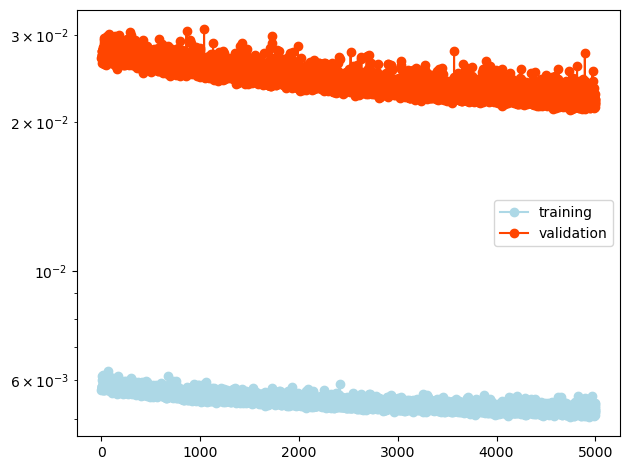

In [234]:
plt.figure()
plt.plot(track_train,'o-',color='lightblue',label='training')
plt.plot(track_val,'o-',color='orangered',label='validation')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

In [71]:
model_student_z=model_student_z.cpu()

In [72]:
model_student_z.load_state_dict(torch.load('./DeepLNE_3states/model_params_student_z.pt'), strict=False)

plumed_model_student_z = DeepLNE_student(ANN_layers=ANN_architecture,
                   f=n_features,
                   act='Tanh')

plumed_model_student_z.load_state_dict(torch.load('./DeepLNE_3states/model_params_student_z.pt'), strict=False)

Numer of input features: 6
ANN architecture:  Sequential(
  (0): Linear(in_features=6, out_features=6, bias=True)
  (1): Tanh()
  (2): Linear(in_features=6, out_features=3, bias=True)
  (3): Tanh()
  (4): Linear(in_features=3, out_features=1, bias=True)
)


<All keys matched successfully>

0.3353176


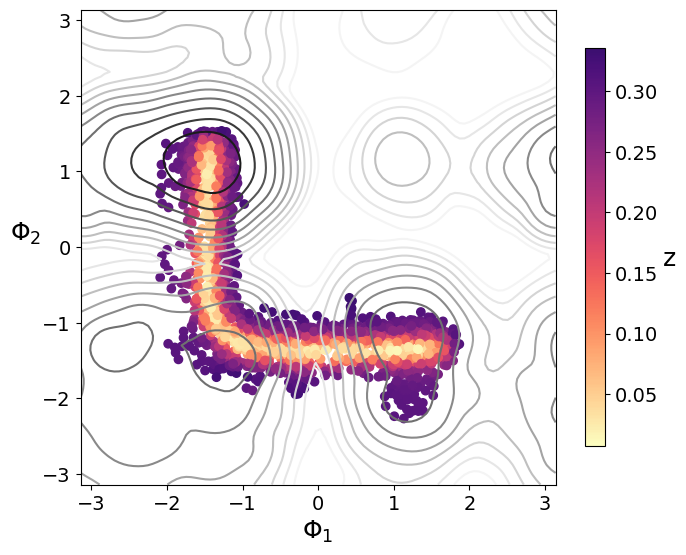

In [40]:
import matplotlib.colors as mcolors

input=torch.Tensor(feature_data_student)
out=plumed_model_student_z(input)

z = out[:,0]
z=z.detach().numpy()

magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256)))  

ndx_inf = np.where(np.isinf(z))
ndx_nan = np.where(np.isnan(z))

max_val = np.nanmax(z[np.isfinite(z)])
print(max_val)

z_show=z
z_show[ndx_inf] = max_val
z_show[ndx_nan] = max_val

fig, ax = plt.subplots(1, figsize=(7,7))
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
contour2=plt.scatter(feature_data_student[:,0],feature_data_student[:,1],c=z_show,cmap=new_magma)

cbar = plt.colorbar(contour2,ax=ax, shrink=0.6)
cbar.set_label(r'z', rotation=0, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0,labelpad=12)
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

torch.Size([4096, 2])
torch.Size([4096, 4])
torch.Size([4096, 6])


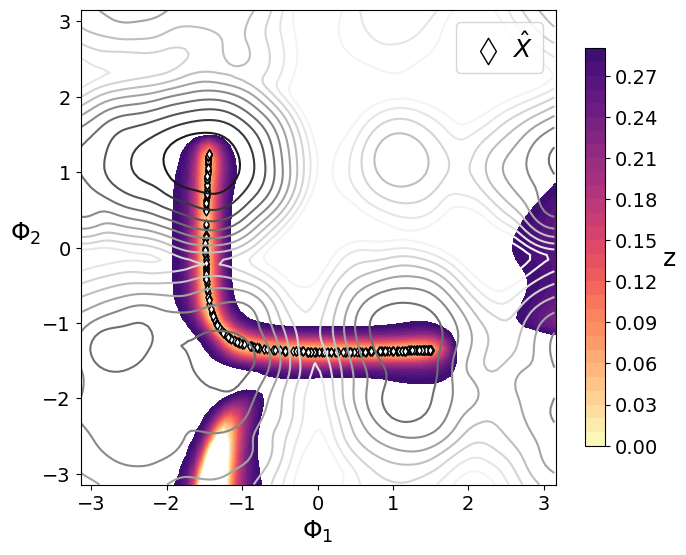

In [249]:
import matplotlib.colors as mcolors

input=model_datapoints
x_hat,s,d,dn=plumed_model.encode_decode(input)
x_hat=x_hat.detach().numpy()

x_range = np.arange(-np.pi, np.pi+0.05, 0.1)
y_range = np.arange(-np.pi, np.pi+0.05, 0.1)

x_grid, y_grid = np.meshgrid(x_range, y_range)

grid_points = np.column_stack((x_grid.flatten(), y_grid.flatten()))

sample_grid=torch.Tensor(grid_points)
fill=torch.ones(sample_grid.shape[0],4)
fill=torch.zeros(sample_grid.shape[0],4)
print(sample_grid.shape)
print(fill.shape)

input=torch.hstack((sample_grid,fill))
print(input.shape)
out=plumed_model_student_z(input)

z = out[:,0]
z=z.detach().numpy()


grid_x = grid_points[:, 0].reshape(x_grid.shape)  
grid_y = grid_points[:, 1].reshape(x_grid.shape)  
grid_z = z.reshape(x_grid.shape)  

magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256)))  

fig, ax = plt.subplots(1, figsize=(7,7))
levels=np.arange(0,0.3,0.01)
contour2 = ax.contourf(grid_x,grid_y,grid_z,levels,cmap=new_magma)
levels=np.arange(0,60,5)
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
plt.scatter(x_hat[:,0], x_hat[:,1],color='white', s=20, marker='d',edgecolors='black',label=r'$\hat{X}$')
cbar = plt.colorbar(contour2,ax=ax, shrink=0.6)
cbar.set_label(r'z', rotation=0, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0,labelpad=12)
ax.set_aspect('equal')
legend = plt.legend(loc='upper right', fontsize=18, markerscale=3, handlelength=1.75, handletextpad=0.1)
plt.tight_layout()
plt.show()

In [250]:
# parameters
multiply_by_stddev = False #whether to multiply derivatives by std dev of inputs
order_by_importance = True #plot results ordered by importance


input_names = colvar.columns[1:7]
print(input_names,len(input_names))

n_input = len(input_names)

in_num=np.arange(n_input)
rank=torch.zeros(n_input)

X=feature_data_student
if multiply_by_stddev:
    in_std=torch.std(torch.Tensor(X),axis=0).numpy()
    
for iteration,x_i in enumerate(X):    

    x_i = torch.Tensor(x_i.reshape(1,-1))
    x_i.requires_grad=True
    # calculate cv 
    s_i = plumed_model_student_z(x_i)[0]
    # calculate derivatives
    grad_i = torch.autograd.grad(s_i,x_i)
    rank += grad_i[0].reshape(-1).abs()

    if iteration%100==0:
        print(iteration)

rank = rank.numpy()

#multiply by std dev
if multiply_by_stddev:
    rank = rank * in_std

#normalize to 1
rank/= np.sum(rank)

#sort
if order_by_importance:
    index= rank.argsort()
    input_names = input_names[index]
    rank = rank[index]

Index(['phi1', 'phi2', 'phi3', 'psi1', 'psi2', 'psi3'], dtype='object') 6
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400


/tmp/ipykernel_1928638/2499428140.py:17: UserWarning:

FixedFormatter should only be used together with FixedLocator



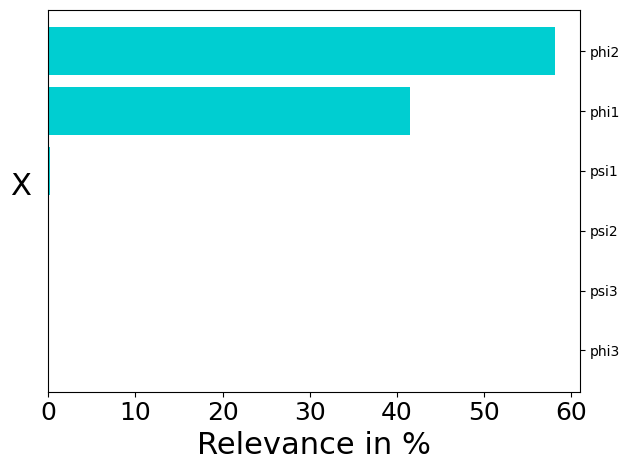

In [251]:
#plot

topk=20
sorted_indices = np.argsort(rank)[::-1]  # Sort in descending order
top_indices = sorted_indices[:topk]  # Select the top 10 indices

# Select the top 10 input features and their corresponding ranks
top_names = [input_names[i] for i in top_indices]
top_ranks = rank[top_indices]
top_in_num = in_num[top_indices]


fig=plt.figure()
ax = fig.add_subplot(111)

ax.barh(top_in_num, top_ranks*100, color='#00CED1',linewidth=0.3)
ax.set_yticklabels(top_names,fontsize=9)


ax.set_xlabel(r'Relevance in %',fontsize=22)
ax.set_ylabel('X',rotation=0,fontsize=22, labelpad=20)
ax.set_yticks(top_in_num)
ax.yaxis.tick_right()
plt.xticks(fontsize=18)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show() 

In [73]:
#train student model s

feature_data_student=torch.Tensor(student_training_datapoints)
label_data_student=torch.Tensor(s_new)

print(torch.isnan(feature_data_student))
print(torch.isnan(label_data_student))

tensor([[False, False, False, False, False, False],
        [False, False, False, False, False, False],
        [False, False, False, False, False, False],
        ...,
        [False, False, False, False, False, False],
        [False, False, False, False, False, False],
        [False, False, False, False, False, False]])
tensor([False, False, False,  ..., False, False, False])


In [74]:
if torch.isnan(label_data_student).any() or torch.isinf(label_data_student).any():
    label_data_student[torch.isnan(label_data_student) | torch.isinf(label_data_student)] = 0.5
            

feature_data_student=feature_data_student.detach().numpy() 
label_data_student=label_data_student.detach().numpy() 

print(feature_data_student.shape)
print(label_data_student.shape)

(1500, 6)
(1500,)


In [75]:
from torch.utils.data import TensorDataset, DataLoader

feature_data_student=torch.tensor(feature_data_student, dtype=torch.float32)
label_data_student=torch.tensor(label_data_student, dtype=torch.float32)

dataset = TensorDataset(feature_data_student, label_data_student)


In [76]:
from torch.utils.data import Subset
from torch.utils.data.dataset import random_split

# Shuffle the dataset before splitting
torch.manual_seed(42)  # Set a random seed for reproducibility
shuffle_dataset = True

dataset_size = len(dataset)
indices = list(range(dataset_size))
if shuffle_dataset:
    np.random.shuffle(indices)

# Split dataset into training and validation sets
train_size = int(0.8 * dataset_size)  # 80% for training, 20% for validation
val_size = dataset_size - train_size
train_indices, val_indices = indices[:train_size], indices[train_size:]
train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

# Define batch size for training
batch_size_train = 64

# Create DataLoader for training set
train_loader = DataLoader(train_dataset, batch_size=batch_size_train, shuffle=True)

# Load entire validation dataset as one big batch
val_features = []
val_labels = []
for val_index in val_indices:
    feature, label = dataset[val_index]
    val_features.append(feature)
    val_labels.append(label)

val_features = torch.stack(val_features)  # Stack features into one big tensor
val_labels = torch.stack(val_labels)  # Stack labels into one big tensor

# Convert to tensor and move to device if necessary
val_features = val_features.to(device)
val_labels = val_labels.to(device)
val_features.shape

torch.Size([300, 6])

In [77]:
for batch_idx, (features, labels) in enumerate(train_loader):
    if batch_idx == 0 :
        print(features.shape)
        print(labels.shape)
batch_size_train*batch_idx

torch.Size([64, 6])
torch.Size([64])


1152

In [78]:
device = torch.device("cuda") #cpu #cuda


ANN_architecture=[3] 

n_features=6

model_student_s = DeepLNE_student(ANN_layers=ANN_architecture,
                   f=n_features,
                   act='Tanh').to(device)


optimizer = optim.Adam(model_student_s.parameters(), lr=0.001)

Numer of input features: 6
ANN architecture:  Sequential(
  (0): Linear(in_features=6, out_features=3, bias=True)
  (1): Tanh()
  (2): Linear(in_features=3, out_features=1, bias=True)
)


In [279]:
device = torch.device("cuda")
model_student_s.to(device)  

track_train = []
track_val = []
best_val_loss = float('inf')  

num_epochs = 5001
for epoch in range(num_epochs):
    train_loss = 0.0
    model_student_z.train()  # Set the model to training mode
    for batch_idx, (features, labels) in enumerate(train_loader):
        # Prepare input and target data
        x = features.to(device)  
        y = labels.to(device) 
        
        out_student = model_student_s.forward(x).flatten()
        
        
        T=1e0
        loss =model_student_s.loss_smoothl1(out_student, y)/T**2
        
        #L2 regularization
        for param in model.parameters():
            loss += 1e-6 * torch.norm(param, 2)
        
        
        # Backward Pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * x.size(0)

    train_loss = train_loss / batch_idx
    track_train.append(train_loss)
    
    # Validation phase
    model_student_s.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    with torch.no_grad():
        
        val_x = val_features.to(device)
        val_y = val_labels.to(device)

        val_out_student = model_student_s.forward(val_x).flatten()

        loss =model_student_s.loss_smoothl1(val_out_student, val_y)/T**2
        
        
    val_loss += loss.item() * val_x.size(0)

    track_val.append(val_loss)
    
    if epoch % 100 == 0:
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(epoch, train_loss, val_loss))

    # Save the best model based on validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        #torch.save(model_student_z, 'model_student_z.pth')  
        torch.save(model_student_s.state_dict(), './DeepLNE_3states/model_params_student_s.pt')


Epoch: 0 	Training Loss: 3.933483 	Validation Loss: 14.874002
Epoch: 100 	Training Loss: 0.019144 	Validation Loss: 0.081293
Epoch: 200 	Training Loss: 0.013280 	Validation Loss: 0.059639
Epoch: 300 	Training Loss: 0.012640 	Validation Loss: 0.055842
Epoch: 400 	Training Loss: 0.008439 	Validation Loss: 0.032942
Epoch: 500 	Training Loss: 0.006380 	Validation Loss: 0.021613
Epoch: 600 	Training Loss: 0.006132 	Validation Loss: 0.020461
Epoch: 700 	Training Loss: 0.006004 	Validation Loss: 0.019705
Epoch: 800 	Training Loss: 0.005652 	Validation Loss: 0.018152
Epoch: 900 	Training Loss: 0.005047 	Validation Loss: 0.015741
Epoch: 1000 	Training Loss: 0.004685 	Validation Loss: 0.014723
Epoch: 1100 	Training Loss: 0.004589 	Validation Loss: 0.014400
Epoch: 1200 	Training Loss: 0.004613 	Validation Loss: 0.013871
Epoch: 1300 	Training Loss: 0.004630 	Validation Loss: 0.013993
Epoch: 1400 	Training Loss: 0.004547 	Validation Loss: 0.015267
Epoch: 1500 	Training Loss: 0.004514 	Validation Lo

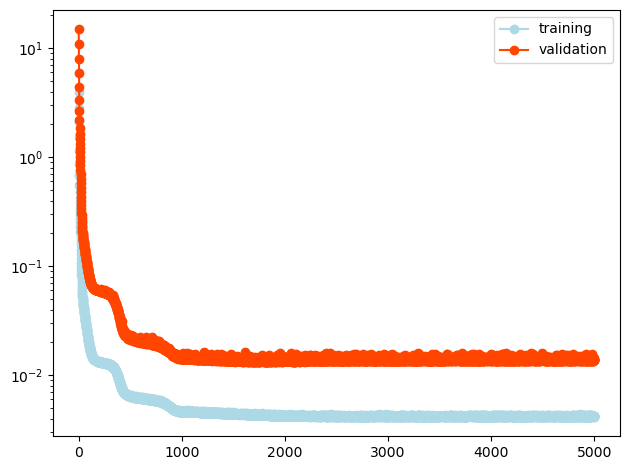

In [280]:
plt.figure()
plt.plot(track_train,'o-',color='lightblue',label='training')
plt.plot(track_val,'o-',color='orangered',label='validation')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

In [79]:
model_student_s=model_student_s.cpu()

In [80]:
model_student_s.load_state_dict(torch.load('./DeepLNE_3states/model_params_student_s.pt'), strict=False)

training_datapoints=torch.Tensor(training_datapoints)

plumed_model_student_s = DeepLNE_student(ANN_layers=ANN_architecture,
                   f=n_features,
                   act='Tanh')

plumed_model_student_s.load_state_dict(torch.load('./DeepLNE_3states/model_params_student_s.pt'), strict=False)

Numer of input features: 6
ANN architecture:  Sequential(
  (0): Linear(in_features=6, out_features=3, bias=True)
  (1): Tanh()
  (2): Linear(in_features=3, out_features=1, bias=True)
)


<All keys matched successfully>

In [283]:
m=torch.jit.trace(plumed_model_student_s,torch.ones(1,n_features))
m.save('./DeepLNE_3states/model_student_s.ptc')

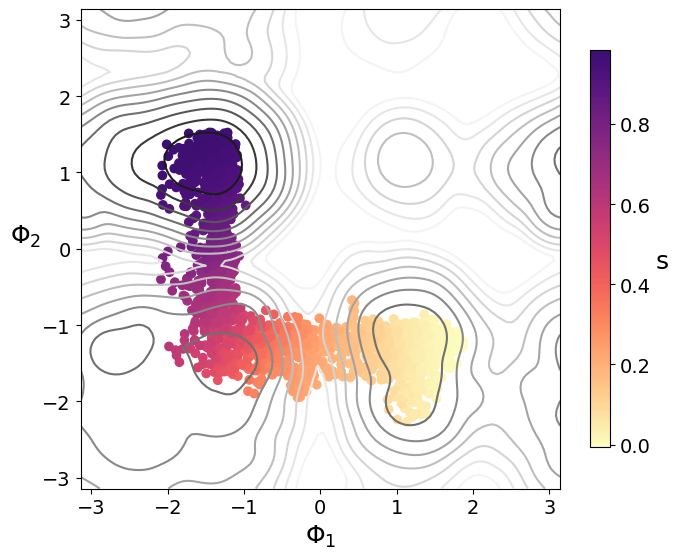

In [284]:
import matplotlib.colors as mcolors

input=torch.Tensor(feature_data_student)
out=plumed_model_student_s(input)

s = out[:,0]
s=s.detach().numpy()

magma = plt.colormaps["magma_r"]
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256))) 

ndx=np.where(s<2)[0]
fig, ax = plt.subplots(1, figsize=(7,7))
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
contour2=plt.scatter(feature_data_student[ndx,0],feature_data_student[ndx,1],c=s[ndx],cmap=new_magma)

cbar = plt.colorbar(contour2,ax=ax, shrink=0.6)
cbar.set_label(r's', rotation=0, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0,labelpad=12)
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

torch.Size([4096, 2])
torch.Size([4096, 4])
torch.Size([4096, 6])


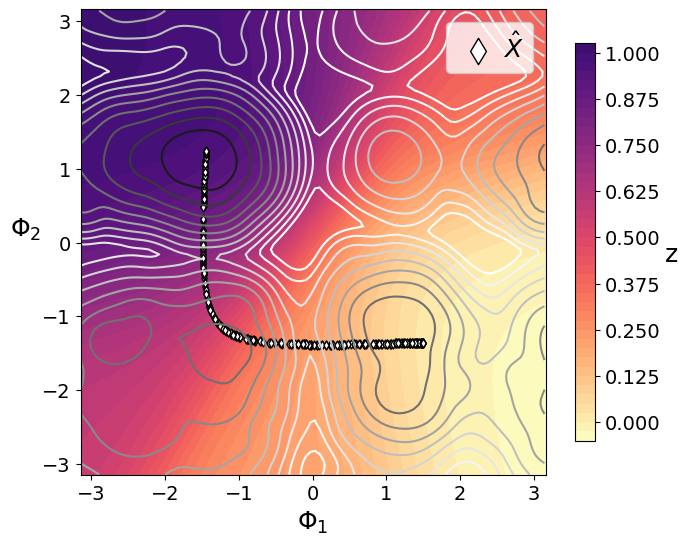

In [285]:
import matplotlib.colors as mcolors

input=model_datapoints
x_hat,s,d,dn=plumed_model.encode_decode(input)
x_hat=x_hat.detach().numpy()

x_range = np.arange(-np.pi, np.pi+0.05, 0.1)
y_range = np.arange(-np.pi, np.pi+0.05, 0.1)

x_grid, y_grid = np.meshgrid(x_range, y_range)

grid_points = np.column_stack((x_grid.flatten(), y_grid.flatten()))

sample_grid=torch.Tensor(grid_points)
fill=torch.ones(sample_grid.shape[0],4)
fill=torch.zeros(sample_grid.shape[0],4)
print(sample_grid.shape)
print(fill.shape)

input=torch.hstack((sample_grid,fill))
print(input.shape)
out=plumed_model_student_s(input)

s = out[:,0]
s=s.detach().numpy()


grid_x = grid_points[:, 0].reshape(x_grid.shape)  
grid_y = grid_points[:, 1].reshape(x_grid.shape)  
grid_s = s.reshape(x_grid.shape)  

magma = plt.colormaps["magma_r"] 
new_magma = mcolors.ListedColormap(magma(np.linspace(0.0, 0.8, 256)))  

fig, ax = plt.subplots(1, figsize=(7,7))
contour2 = ax.contourf(grid_x,grid_y,grid_s,50,cmap=new_magma)
levels=np.arange(0,60,5)
ax.contour(phi_grid, psi_grid, file_free_grid,levels, cmap='Greys_r')
plt.scatter(x_hat[:,0], x_hat[:,1],color='white', s=20, marker='d',edgecolors='black',label=r'$\hat{X}$')
cbar = plt.colorbar(contour2,ax=ax, shrink=0.6)
cbar.set_label(r'z', rotation=0, labelpad=8,fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r'$\Phi_1$',fontsize=18)
plt.ylabel(r'$\Phi_2$',fontsize=18,rotation=0,labelpad=12)
ax.set_aspect('equal')
legend = plt.legend(loc='upper right', fontsize=18, markerscale=3, handlelength=1.75, handletextpad=0.1)
plt.tight_layout()
plt.show()

In [286]:
# parameters
multiply_by_stddev = False #whether to multiply derivatives by std dev of inputs
order_by_importance = True #plot results ordered by importance

input_names = colvar.columns[1:7]
print(input_names,len(input_names))

n_input = len(input_names)

#init arrays
in_num=np.arange(n_input)
rank=torch.zeros(n_input)

X=training_datapoints
#compute input std dev
if multiply_by_stddev:
    in_std=torch.std(torch.Tensor(X),axis=0).numpy()
    
for iteration,x_i in enumerate(X):    

    x_i = torch.Tensor(x_i.reshape(1,-1))
    x_i.requires_grad=True
    # calculate cv 
    s_i = plumed_model_student_s(x_i)[0]
    # calculate derivatives
    grad_i = torch.autograd.grad(s_i,x_i)
    rank += grad_i[0].reshape(-1).abs()

    if iteration%100==0:
        print(iteration)

rank = rank.numpy()

#multiply by std dev
if multiply_by_stddev:
    rank = rank * in_std

#normalize to 1
rank/= np.sum(rank)

#sort
if order_by_importance:
    index= rank.argsort()
    input_names = input_names[index]
    rank = rank[index]

Index(['phi1', 'phi2', 'phi3', 'psi1', 'psi2', 'psi3'], dtype='object') 6
0
100
200
300
400
500
600
700
800
900


/tmp/ipykernel_1928638/2499428140.py:17: UserWarning:

FixedFormatter should only be used together with FixedLocator



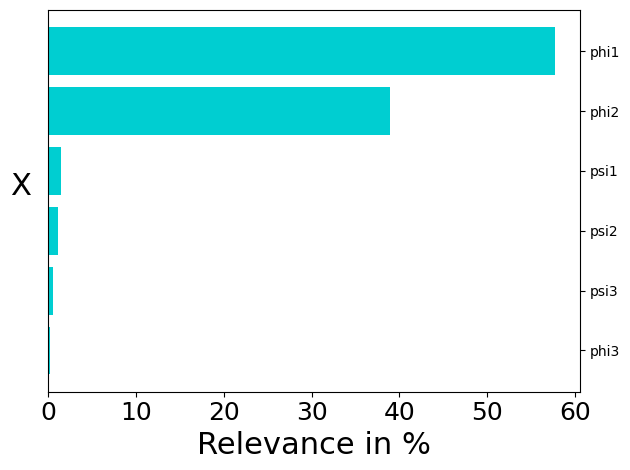

In [287]:
#plot

topk=20
sorted_indices = np.argsort(rank)[::-1]  # Sort in descending order
top_indices = sorted_indices[:topk]  # Select the top 10 indices

# Select the top 10 input features and their corresponding ranks
top_names = [input_names[i] for i in top_indices]
top_ranks = rank[top_indices]
top_in_num = in_num[top_indices]


fig=plt.figure()
ax = fig.add_subplot(111)

ax.barh(top_in_num, top_ranks*100, color='#00CED1',linewidth=0.3)
ax.set_yticklabels(top_names,fontsize=9)


ax.set_xlabel(r'Relevance in %',fontsize=22)
ax.set_ylabel('X',rotation=0,fontsize=22, labelpad=20)
ax.set_yticks(top_in_num)
ax.yaxis.tick_right()
plt.xticks(fontsize=18)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show() 

In [288]:
#we have 2 student models, 1 learning s and one learning z

In [81]:
def dumpPlumed(filename, model, activation='tanh'):
    # Extract weights and biases from the model
    weights = [param.detach().numpy().T for param in model.parameters() if len(param.size()) == 2]
    biases = [param.detach().numpy() for param in model.parameters() if len(param.size()) == 1]

    # Flatten and concatenate weights and biases
    par = np.hstack([param.flatten() for param in weights + biases])

    # Reshape weights and biases according to the original shapes
    n = 0
    for i in range(len(weights)):
        weights[i] = np.reshape(par[n:n+np.prod(weights[i].shape)], weights[i].shape)
        n += np.prod(weights[i].shape)
    for i in range(len(biases)):
        biases[i] = np.reshape(par[n:n+np.prod(biases[i].shape)], biases[i].shape)
        n += np.prod(biases[i].shape)

    # Write weights, biases, and activations to the file
    with open(filename, "w") as f:
        for i in range(len(weights)):
            ni, no = weights[i].shape
            print("#! FIELDS " + " ".join(["w"+str(j) for j in range(ni)]), file=f)
            for j in range(no):
                print(' '.join(map(str, weights[i][:,j])), file=f)
            print("#! FIELDS " + " ".join(["b"+str(j) for j in range(no)]), file=f)
            print(' '.join(map(str, biases[i])), file=f)
            if i+1 < len(weights):
                print("#! FIELDS " + " ".join(["activation"+str(j) for j in range(no)]), file=f)
                print(' '.join([activation]*no), file=f)

(25,)

In [ ]:
dumpPlumed('./DeepLNE_3states/ann_multi_s.dat', model_student_s, 'tanh')

In [ ]:
dumpPlumed('./DeepLNE_3states/ann_multi_z.dat', model_student_z, 'tanh')

In [ ]:
%%bash 
cat > MultiANN_tanh.cpp << EOF
/* +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
   Copyright (c) 2011-2021 The plumed team
   (see the PEOPLE file at the root of the distribution for a list of names)

   See http://www.plumed.org for more information.

   This file is part of plumed, version 2.

   plumed is free software: you can redistribute it and/or modify
   it under the terms of the GNU Lesser General Public License as published by
   the Free Software Foundation, either version 3 of the License, or
   (at your option) any later version.

   plumed is distributed in the hope that it will be useful,
   but WITHOUT ANY WARRANTY; without even the implied warranty of
   MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
   GNU Lesser General Public License for more details.

   You should have received a copy of the GNU Lesser General Public License
   along with plumed.  If not, see <http://www.gnu.org/licenses/>.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++ */
#include "/home/rizziv@farma.unige.ch/plumed2-2.9/src/function/Function.h"
#include "/home/rizziv@farma.unige.ch/plumed2-2.9/src/function/ActionRegister.h"
#include "/home/rizziv@farma.unige.ch/plumed2-2.9/src/tools/IFile.h"
#include "/home/rizziv@farma.unige.ch/plumed2-2.9/src/tools/Matrix.h"

#include <cmath>
#include <algorithm>

using namespace std;

namespace PLMD {
namespace function {

class MultiANN :
  public Function
{
  enum class Activation {
    Softplus, 
    Tanh
  };
  unsigned groupby;
  // weights
  std::vector<Matrix<double>> weights;
  // transpose matrices (this is to avoid taking the transpose in calculate()
  std::vector<Matrix<double>> weights_transposed;
  // biases
  std::vector<std::vector<double>> biases;
  // activation functions (custom for each node of each layer)
  std::vector<std::vector<Activation>> activation;
  // value of each layer
  std::vector<Matrix<double>> layers;
  // derivative of result wrt values at each layer
  std::vector<Matrix<double>> dlayers;
  // derivative of the activation function (stored in the forward loop for efficienty)
  std::vector<Matrix<double>> dactivation;
public:
  explicit MultiANN(const ActionOptions&);
  void calculate() override;
  static void registerKeywords(Keywords& keys);
};


PLUMED_REGISTER_ACTION(MultiANN,"MULTI_ANN")

void MultiANN::registerKeywords(Keywords& keys) {
  Function::registerKeywords(keys);
  keys.use("ARG");
  keys.add("compulsory","PARAMETERS","ANN.dat","parameter file");
  keys.add("compulsory","GROUPBY","1","groups");
}

MultiANN::MultiANN(const ActionOptions&ao):
  Action(ao),
  Function(ao)
{
  groupby=1;
  parse("GROUPBY",groupby);
  log<<"  groupby: "<<groupby<<"\n";
  plumed_assert(getNumberOfArguments()%groupby==0);
  std::string parfile="";
  parse("PARAMETERS",parfile);
  log<<"  parameters file: "<<parfile<<"\n";
  plumed_assert(parfile.length()>0);
  IFile ifile;
  ifile.link(*this);
  ifile.open(parfile);
  unsigned previous_layer=groupby;
  layers.push_back(Matrix<double>(getNumberOfArguments()/groupby,groupby));
  dlayers.push_back(Matrix<double>(getNumberOfArguments()/groupby,groupby));
  dactivation.push_back(Matrix<double>(getNumberOfArguments()/groupby,groupby));
  while(true) { // layers
    std::vector<std::vector<double>> weights_rows;
    log<<"  weights:\n";
    while(true) { // weights
      std::vector<double> weights_row;
      if(!ifile.FieldExist("w0")) break;
      log<<"  *";
      for(unsigned i=0; i<previous_layer; i++) {
        std::string item;
        Tools::convert(i,item);
        item="w"+item;
        double w=0.0;
        ifile.scanField(item,w);
        weights_row.push_back(w);
        log<<" "<<w;
      }
      log<<"\n";
      ifile.scanField(); // end of line
      if(weights_rows.size()>1) plumed_assert(weights_rows[0].size()==weights_row.size());
      weights_rows.push_back(weights_row);
    }
    plumed_assert(weights_rows.size()>0);
    auto neww=Matrix<double>(weights_rows[0].size(),weights_rows.size());
    for(unsigned i=0; i<weights_rows.size(); i++) {
      for(unsigned j=0; j<weights_rows[0].size(); j++) {
        neww(j,i)=weights_rows[i][j];
      }
    }
    weights.push_back(neww);
    previous_layer=weights_rows.size();
    std::vector<double> biases_row;
    plumed_assert(ifile.FieldExist("b0"));
    log<< "  biases: ";
    for(unsigned i=0; i<previous_layer; i++) {
      std::string item;
      Tools::convert(i,item);
      item="b"+item;
      double b=0.0;
      ifile.scanField(item,b);
      log<<" "<<b;
      biases_row.push_back(b);
    }
    log<<"\n";
    ifile.scanField(); // end of line;
    biases.push_back(biases_row);
    std::vector<Activation> activation_row;
    if(!ifile.FieldExist("activation0")) break;
    log<<"  activation:";
    for(unsigned i=0; i<previous_layer; i++) {
      std::string item;
      Tools::convert(i,item);
      item="activation"+item;
      std::string a;
      if(!ifile.scanField(item,a)) break;
      Activation aa;
      if(a=="softplus") {
        aa=Activation::Softplus;
      } else if (a == "tanh") {
        aa = Activation::Tanh;
      } else {
        plumed_error();
      }
      log<<" "<<a;
      activation_row.push_back(aa);
    }
    log<<"\n";
    ifile.scanField(); // end of line;
    plumed_assert(activation_row.size()==previous_layer);
    activation.push_back(activation_row);
  }

  for(unsigned i=0; i<weights.size(); i++) {
    layers.push_back(Matrix<double>(getNumberOfArguments()/groupby,weights[i].ncols()));
    dlayers.push_back(Matrix<double>(getNumberOfArguments()/groupby,weights[i].ncols()));
    dactivation.push_back(Matrix<double>(getNumberOfArguments()/groupby,weights[i].ncols()));
    Matrix<double> tw;
    transpose(weights[i],tw);
    weights_transposed.push_back(tw);
  }

  addValueWithDerivatives();
  getPntrToComponent(0)->setNotPeriodic();
  checkRead();

}

void MultiANN::calculate() {

  // init
  for(unsigned i=0; i<getNumberOfArguments(); i++) {
    layers[0](i/groupby,i%groupby)=getArgument(i);
  }

  // forward loop
  for(unsigned i=0; i<weights.size(); i++) {

    mult(layers[i],weights[i],layers[i+1]);

    for(unsigned j=0; j<layers[i+1].nrows(); j++) {
      for(unsigned k=0; k<layers[i+1].ncols(); k++) {
        layers[i+1](j,k)+=biases[i][k];
      }
    }
    if(i<weights.size()-1) {
      for(unsigned k=0; k<layers[i+1].ncols(); k++) {
        switch(activation[i][k]) {
        case Activation::Softplus:
        {
          // compute both activation and dactivation, to save on the exponential
          for(unsigned j=0; j<layers[i+1].nrows(); j++) {
            auto x=layers[i+1](j,k);
            auto expabsx=std::exp(-std::abs(x));
            auto y=std::log1p(expabsx) + std::max(x,0.0);
            auto dy=0.0;
            if(x>=0) dy=1.0/(1.0+expabsx);
            else     dy=expabsx/(1.0+expabsx);
            layers[i+1](j,k)=y;
            dactivation[i+1](j,k)=dy;
          }
          break;
        }
        case Activation::Tanh:
        {
            // compute both activation and dactivation using tanh and its derivative
            for(unsigned j=0; j<layers[i+1].nrows(); j++) {
                auto x = layers[i+1](j,k);
                auto y = std::tanh(x);
                auto dy = 1.0 - y*y; // tanh derivative: 1 - tanh^2(x)
                layers[i+1](j,k) = y;
                dactivation[i+1](j,k) = dy;
            }
            break;
        }
        default:
          plumed_error();
        }
      }
    }
  }
  double combine=0.0;
  for(unsigned i=0; i<layers[layers.size()-1].nrows(); i++) combine+=layers[layers.size()-1](i,0);


  // init
  for(unsigned i=0; i<layers[layers.size()-1].nrows(); i++) dlayers[layers.size()-1](i,0)=1.0;

  // backward loop
  for(unsigned i=layers.size()-1; i>0; i--) {
    if(i<layers.size()-1) {
      for(unsigned k=0; k<dlayers[i].nrows(); k++) for(unsigned l=0; l<dlayers[i].ncols(); l++)
          dlayers[i](k,l)*=dactivation[i](k,l);
    }
    mult(dlayers[i],weights_transposed[i-1],dlayers[i-1]);
  }

  setValue(combine);
  for(unsigned i=0; i<getNumberOfArguments(); i++) {
    setDerivative(i,dlayers[0](i/groupby,i%groupby));
  }

}

}
}


EOF

In [ ]:
plumed mklib MultiANN_tanh.cpp

In [296]:
#run OPES with DeepLNE MultiANN

In [54]:
folder = 'OPES3/'

Path(folder).mkdir(parents=True, exist_ok=True)

In [55]:
%%bash 
cat > OPES3/Production.mdp << EOF
; RUN PARAMETERS
integrator               = md
dt                       = 0.002
nsteps                   = 500000000               ;number of steps 1000000ps 1ms
nstxout                  = 500000                     ; high precision every 0.1ps
nstvout                  =     
nstlog                   = 500000
nstenergy                = 500000
nstxtcout                = 500000
xtc_grps                 = System     ;group(s) to write to xtc trajectory
energygrps               = System       ;group(s) to write to energy file 
                                                
;NEIGHBORING SEARCHING PARAMETERS
nstlist                  = 10                   ;Frequency to update the neighbor list (and the long-range forces, 
ns_type                  = Grid                 ;Make a grid in the box and only check atoms in neighboring grid cells 
                                                ;when constructing a new neighbor list every nstlist steps                                      
pbc                      = xyz                  ; Periodic boudary conditions in all the directions 
rlist                    = 1.0

;OPTIONS FOR ELECTROSTATICS AND VDW
cutoff-scheme            = Verlet
coulombtype              = PME 
pme_order                = 4                     ;cubic interpolation
fourierspacing           = 0.12 
rcoulomb                 = 1.0
vdw-type                 = Cut-off
rvdw                     = 1.0


;TEMPERATURE COUPLING
tcoupl                   = v-rescale            ;Temperature coupling
tc-grps                  = System
tau_t                    = 0.1
ref_t                    = 300

;DISPERSION CORRECTION
DispCorr                 = EnerPres             ; account for vdw cut-off

;PRESSURE COUPLING
Pcoupl                   = no                   ;NVT simulation

continuation             = yes
gen_vel                  = no                   ;Velocity generation
gen_temp                 = 300
gen_seed                 = -1

;OPTIONS FOR BONDS
lincs_iter               = 1
lincs_order              = 4
constraints              = h-bonds
EOF

In [123]:
%%bash 
gmx_mpi grompp -f OPES3/Production.mdp -c ./ABMD_2Levels/stateC1.pdb -p topol.top -n index.ndx -o OPES3/MD.tpr 

             :-) GROMACS - gmx grompp, 2022.5-plumed_2.10.0_dev (-:

Executable:   /home/rizziv@farma.unige.ch/programs/gromacs-2022.5/install_single_cuda/bin/gmx_mpi
Data prefix:  /home/rizziv@farma.unige.ch/programs/gromacs-2022.5/install_single_cuda
Working dir:  /home/frohlkin@farma.unige.ch/Projects/TransitionPathSampling_DeepLNE/Publication_Toymodels/Trialanine
Command line:
  gmx_mpi grompp -f OPES3/Production.mdp -c ./ABMD_2Levels/stateC1.pdb -p topol.top -n index.ndx -o OPES3/MD.tpr

Ignoring obsolete mdp entry 'ns_type'
Replacing old mdp entry 'nstxtcout' by 'nstxout-compressed'
Replacing old mdp entry 'xtc_grps' by 'compressed-x-grps'
Generating 1-4 interactions: fudge = 0.5
Number of degrees of freedom in T-Coupling group System is 101.00

NOTE 1 [file OPES3/Production.mdp]:
  The optimal PME mesh load for parallel simulations is below 0.5
  and for highly parallel simulations between 0.25 and 0.33,
  for higher performance, increase the cut-off and the PME grid spacing.




Setting the LD random seed to -738918913

Generated 3485 of the 3486 non-bonded parameter combinations

Generated 3486 of the 3486 1-4 parameter combinations

Excluding 3 bonded neighbours molecule type 'Protein'

turning H bonds into constraints...

The largest distance between excluded atoms is 0.390 nm

Determining Verlet buffer for a tolerance of 0.005 kJ/mol/ps at 300 K

Calculated rlist for 1x1 atom pair-list as 1.000 nm, buffer size 0.000 nm

Set rlist, assuming 4x4 atom pair-list, to 1.000 nm, buffer size 0.000 nm

Note that mdrun will redetermine rlist based on the actual pair-list setup
Calculating fourier grid dimensions for X Y Z
Using a fourier grid of 28x28x28, spacing 0.110 0.110 0.110

Estimate for the relative computational load of the PME mesh part: 0.95

This run will generate roughly 5 Mb of data


In [118]:
lines=[]
lines.append('LOAD FILE=MultiANN_tanh.so\n')


lines.append('MOLINFO STRUCTURE=molinfo_trialanine.pdb\n')

features=[]
lines.append('phi1: TORSION ATOMS=@phi-2\n')
lines.append('phi2: TORSION ATOMS=@phi-3\n')
lines.append('phi3: TORSION ATOMS=@phi-4\n')
lines.append('psi1: TORSION ATOMS=@psi-2\n')
lines.append('psi2: TORSION ATOMS=@psi-3\n')
lines.append('psi3: TORSION ATOMS=@psi-4\n')
lines.append('ene: ENERGY\n')

features.append('phi1')
features.append('phi2')
features.append('phi3')
features.append('psi1')
features.append('psi2')
features.append('psi3')

features = ','.join(features)
lines.append('model_s: MULTI_ANN ARG=%s PARAMETERS=ann_multi_s.dat groupby=6 \n' %features)
lines.append('model_z: MULTI_ANN ARG=%s PARAMETERS=ann_multi_z.dat groupby=6 \n' %features)

lines.append('OPES_METAD ...\n')
lines.append('  LABEL=opes\n')
lines.append('  ARG=model_s\n')
lines.append('  FILE=Kernels.data\n')
lines.append('  STATE_RFILE=compressed.Kernels\n')
lines.append('  STATE_WFILE=compressed.Kernels\n')
lines.append('  PACE=1000\n')
lines.append('  BARRIER=40\n')
lines.append('... OPES_METAD\n')

lines.append('uwall_z: UPPER_WALLS ARG=model_z KAPPA=5000 AT=0.2\n')
    

lines.append('PRINT STRIDE=250 FILE=COLVAR ARG=* FMT=%7.4f\n')

lines.append('ENDPLUMED\n')

f = open("OPES3/plumed.dat", "w")
for elem in lines:
    f.writelines(elem)
f.close()

In [62]:
!scp molinfo_trialanine.pdb OPES3/
!scp ./DeepLNE_3states/ann_multi_s.dat OPES3/
!scp ./DeepLNE_3states/ann_multi_z.dat OPES3/
!scp ./DeepLNE_3states/model_teacher.ptc OPES3/

In [124]:
%%bash 
cat > OPES3/run.sh << EOF
export OMP_NUM_THREADS=1
mpirun -n 1 gmx_mpi mdrun -deffnm MD -plumed plumed.dat -pin on -pinoffset 0 -notunepme -nsteps 100000000 -nb gpu &
EOF

In [283]:
!find . -type f -name "#*" -exec rm -rf {} +
!find . -type f -name "step*" -exec rm -rf {} +
!find . -type f -name "bck*" -exec rm -rf {} +

In [284]:
colvar=plumed.read_as_pandas("OPES3/COLVAR")
colvar

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


,time,phi1,phi2,phi3,psi1,psi2,psi3,ene,model_s,model_z,opes.bias,opes.rct,opes.zed,opes.neff,opes.nker,uwall_z.bias,uwall_z.force2
0,0.0,-1.3001,1.3143,-1.1466,0.9840,-0.3462,1.6213,-818.4628,0.9617,0.1901,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0,0.0
1,0.5,-1.5826,1.0076,-1.4755,1.0567,-0.9598,2.6786,-832.7632,0.9574,0.1220,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0,0.0
2,1.0,-1.5488,1.1594,-2.2301,1.0102,-0.4973,-2.9148,-763.1096,0.9591,0.0898,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0,0.0
3,1.5,-1.4781,1.2710,-1.3132,0.8576,-0.6591,2.4271,-780.0916,0.9680,0.0608,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0,0.0
4,2.0,-1.5276,1.0284,-1.0923,1.1003,-0.9459,2.1202,-830.3583,0.9561,0.0571,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399996,199998.0,-1.4040,0.3698,-0.9865,0.9123,-0.6182,1.5304,-802.1898,0.8686,0.0723,-18.5107,1.8641,0.0416,12916.3285,96.0,0.0,0.0
399997,199998.5,-1.5236,1.3263,-1.1606,0.9523,-1.2297,2.3050,-755.9134,0.9723,0.1197,5.4844,1.8641,0.0416,12916.3285,96.0,0.0,0.0
399998,199999.0,-1.4137,0.5853,-1.1874,1.2601,-0.9526,2.6672,-779.0106,0.9063,0.0629,-5.5999,1.8641,0.0416,12916.3285,96.0,0.0,0.0
399999,199999.5,-1.4078,0.3768,-0.9453,1.1902,-0.6956,2.2430,-762.4886,0.8717,0.0683,-17.4956,1.8641,0.0416,12916.3285,96.0,0.0,0.0


In [285]:
%load_ext gnuplot_kernel

The gnuplot_kernel extension is already loaded. To reload it, use:
  %reload_ext gnuplot_kernel


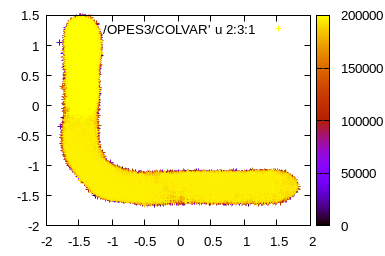

In [286]:
%%gnuplot
p './OPES3/COLVAR' u 2:3:1 pal

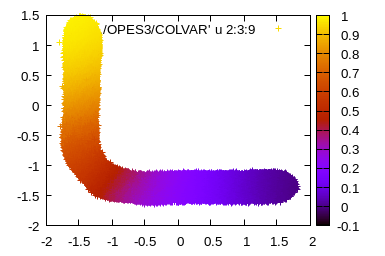

In [287]:
%%gnuplot
p './OPES3/COLVAR' u 2:3:9 pal

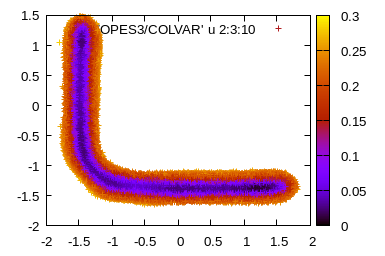

In [288]:
%%gnuplot
p './OPES3/COLVAR' u 2:3:10 pal

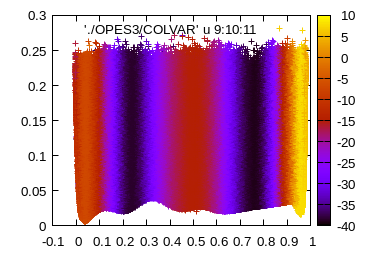

In [289]:
%%gnuplot
p './OPES3/COLVAR' u 9:10:11 pal

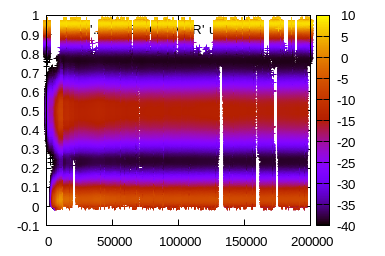

In [290]:
%%gnuplot
p './OPES3/COLVAR' u 1:9:11 pal

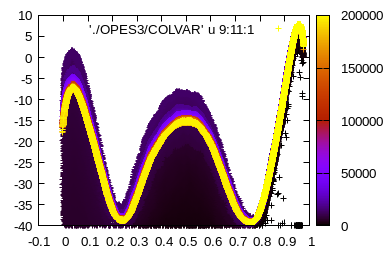

In [291]:
%%gnuplot
p './OPES3/COLVAR' u 9:11:1 pal

In [292]:
skip=10 

label=colvar['model_s'].to_numpy()[::skip] 
phi1=colvar['phi1'].to_numpy()[::skip]
phi2=colvar['phi2'].to_numpy()[::skip]
phi3=colvar['phi3'].to_numpy()[::skip]


print(phi1.shape)
print(phi2.shape)
print(phi3.shape)

import plotly.graph_objects as go


fig = go.Figure(data=go.Scatter3d(
    x=phi1,
    y=phi2,
    z=phi3,
    mode='markers',
    marker=dict(
        size=5,
        color=label,            
        colorscale='electric', 
        opacity=0.2,
        colorbar=dict(title=r's')
    )
))

fig.update_layout(
    scene=dict(
        xaxis=dict(backgroundcolor='#CCCCCC'),
        yaxis=dict(backgroundcolor='#CCCCCC'),
        zaxis=dict(backgroundcolor='#CCCCCC', gridcolor='rgba(0, 0, 0, 0)')
    )
)

fig.update_layout(
    scene=dict(
        xaxis=dict(title=r'ϕ1'),
        yaxis=dict(title=r'ϕ2'),
        zaxis=dict(title=r'ϕ3')
    )
)

fig.show()


(40001,)
(40001,)
(40001,)


In [948]:
#run a reference run with the same restraint on z

In [949]:
#run OPES with DeepLNE MultiANN

In [92]:
folder = 'OPES3_reference/'

Path(folder).mkdir(parents=True, exist_ok=True)

In [93]:
%%bash 
cat > OPES3_reference/Production.mdp << EOF
; RUN PARAMETERS
integrator               = md
dt                       = 0.002
nsteps                   = 500000000               ;number of steps 1000000ps 1ms
nstxout                  = 500000                     ; high precision every 0.1ps
nstvout                  =     
nstlog                   = 500000
nstenergy                = 500000
nstxtcout                = 500000
xtc_grps                 = System     ;group(s) to write to xtc trajectory
energygrps               = System       ;group(s) to write to energy file 
                                                
;NEIGHBORING SEARCHING PARAMETERS
nstlist                  = 10                   ;Frequency to update the neighbor list (and the long-range forces, 
ns_type                  = Grid                 ;Make a grid in the box and only check atoms in neighboring grid cells 
                                                ;when constructing a new neighbor list every nstlist steps                                      
pbc                      = xyz                  ; Periodic boudary conditions in all the directions 
rlist                    = 1.0

;OPTIONS FOR ELECTROSTATICS AND VDW
cutoff-scheme            = Verlet
coulombtype              = PME 
pme_order                = 4                     ;cubic interpolation
fourierspacing           = 0.12 
rcoulomb                 = 1.0
vdw-type                 = Cut-off
rvdw                     = 1.0


;TEMPERATURE COUPLING
tcoupl                   = v-rescale            ;Temperature coupling
tc-grps                  = System
tau_t                    = 0.1
ref_t                    = 300

;DISPERSION CORRECTION
DispCorr                 = EnerPres             ; account for vdw cut-off

;PRESSURE COUPLING
Pcoupl                   = no                   ;NVT simulation

continuation             = yes
gen_vel                  = no                   ;Velocity generation
gen_temp                 = 300
gen_seed                 = -1

;OPTIONS FOR BONDS
lincs_iter               = 1
lincs_order              = 4
constraints              = h-bonds
EOF

In [125]:
%%bash 
gmx_mpi grompp -f OPES3_reference/Production.mdp -c ./ABMD_2Levels/stateC1.pdb -p topol.top -n index.ndx -o OPES3_reference/MD.tpr 

             :-) GROMACS - gmx grompp, 2022.5-plumed_2.10.0_dev (-:

Executable:   /home/rizziv@farma.unige.ch/programs/gromacs-2022.5/install_single_cuda/bin/gmx_mpi
Data prefix:  /home/rizziv@farma.unige.ch/programs/gromacs-2022.5/install_single_cuda
Working dir:  /home/frohlkin@farma.unige.ch/Projects/TransitionPathSampling_DeepLNE/Publication_Toymodels/Trialanine
Command line:
  gmx_mpi grompp -f OPES3_reference/Production.mdp -c ./ABMD_2Levels/stateC1.pdb -p topol.top -n index.ndx -o OPES3_reference/MD.tpr

Ignoring obsolete mdp entry 'ns_type'
Replacing old mdp entry 'nstxtcout' by 'nstxout-compressed'
Replacing old mdp entry 'xtc_grps' by 'compressed-x-grps'
Generating 1-4 interactions: fudge = 0.5
Number of degrees of freedom in T-Coupling group System is 101.00

NOTE 1 [file OPES3_reference/Production.mdp]:
  The optimal PME mesh load for parallel simulations is below 0.5
  and for highly parallel simulations between 0.25 and 0.33,
  for higher performance, increase the cut-of

Setting the LD random seed to -33603846

Generated 3485 of the 3486 non-bonded parameter combinations

Generated 3486 of the 3486 1-4 parameter combinations

Excluding 3 bonded neighbours molecule type 'Protein'

turning H bonds into constraints...

The largest distance between excluded atoms is 0.390 nm

Determining Verlet buffer for a tolerance of 0.005 kJ/mol/ps at 300 K

Calculated rlist for 1x1 atom pair-list as 1.000 nm, buffer size 0.000 nm

Set rlist, assuming 4x4 atom pair-list, to 1.000 nm, buffer size 0.000 nm

Note that mdrun will redetermine rlist based on the actual pair-list setup
Calculating fourier grid dimensions for X Y Z
Using a fourier grid of 28x28x28, spacing 0.110 0.110 0.110

Estimate for the relative computational load of the PME mesh part: 0.95

This run will generate roughly 5 Mb of data


In [126]:
lines=[]
lines.append('LOAD FILE=MultiANN_tanh.so\n')

lines.append('#RESTART\n')

lines.append('MOLINFO STRUCTURE=molinfo_trialanine.pdb\n')

features=[]
lines.append('phi1: TORSION ATOMS=@phi-2\n')
lines.append('phi2: TORSION ATOMS=@phi-3\n')
lines.append('phi3: TORSION ATOMS=@phi-4\n')
lines.append('psi1: TORSION ATOMS=@psi-2\n')
lines.append('psi2: TORSION ATOMS=@psi-3\n')
lines.append('psi3: TORSION ATOMS=@psi-4\n')
lines.append('ene: ENERGY\n')

features.append('phi1')
features.append('phi2')
features.append('phi3')
features.append('psi1')
features.append('psi2')
features.append('psi3')

features = ','.join(features)
lines.append('model_s: MULTI_ANN ARG=%s PARAMETERS=ann_multi_s.dat groupby=6 \n' %features)
lines.append('model_z: MULTI_ANN ARG=%s PARAMETERS=ann_multi_z.dat groupby=6 \n' %features)

lines.append('OPES_METAD ...\n')
lines.append('  LABEL=opes\n')
lines.append('  ARG=phi1,phi2\n')
lines.append('  FILE=Kernels.data\n')
lines.append('  STATE_RFILE=compressed.Kernels\n')
lines.append('  STATE_WFILE=compressed.Kernels\n')
lines.append('  PACE=1000\n')
lines.append('  BARRIER=40\n')
lines.append('... OPES_METAD\n')

lines.append('uwall_z: UPPER_WALLS ARG=model_z KAPPA=5000 AT=0.2\n')
    

lines.append('PRINT STRIDE=250 FILE=COLVAR ARG=* FMT=%7.4f\n')

lines.append('ENDPLUMED\n')

f = open("OPES3_reference/plumed.dat", "w")
for elem in lines:
    f.writelines(elem)
f.close()

In [99]:
!scp molinfo_trialanine.pdb OPES3_reference/
!scp ./DeepLNE_3states/ann_multi_s.dat OPES3_reference/
!scp ./DeepLNE_3states/ann_multi_z.dat OPES3_reference/
!scp ./DeepLNE_3states/model_teacher.ptc OPES3_reference/

In [127]:
%%bash 
cat > OPES3_reference/run.sh << EOF
export OMP_NUM_THREADS=1
mpirun -n 1 gmx_mpi mdrun -deffnm MD -plumed plumed.dat -pin on -pinoffset 8 -notunepme -nsteps 100000000 -nb gpu &
EOF

In [274]:
!find . -type f -name "#*" -exec rm -rf {} +
!find . -type f -name "step*" -exec rm -rf {} +
!find . -type f -name "bck*" -exec rm -rf {} +

In [275]:
colvar=plumed.read_as_pandas("OPES3_reference/COLVAR")
colvar

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


,time,phi1,phi2,phi3,psi1,psi2,psi3,ene,model_s,model_z,opes.bias,opes.rct,opes.zed,opes.neff,opes.nker,uwall_z.bias,uwall_z.force2
0,0.0,-1.3001,1.3143,-1.1466,0.9840,-0.3462,1.6213,-818.4628,0.9617,0.1901,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0000,0.0000
1,0.5,-1.5503,1.0313,-1.5527,1.0445,-0.9687,2.8130,-819.7422,0.9579,0.0822,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0000,0.0000
2,1.0,-1.3941,1.2152,-2.0842,1.0347,-0.6530,-3.0304,-769.7367,0.9565,0.0584,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0000,0.0000
3,1.5,-1.6252,1.0202,-1.0472,0.8090,-0.7657,1.7757,-794.5493,0.9589,0.1744,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0000,0.0000
4,2.0,-1.3570,1.1638,-1.5330,1.4362,-1.0282,2.1646,-802.8124,0.9572,0.0908,-40.0000,-40.0000,1.0000,1.0000,0.0,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399996,199998.0,1.2475,-1.1394,-1.4272,-1.1826,-0.6373,1.5665,-773.5272,0.0370,0.2209,-9.6809,1.6543,0.0343,14020.1239,3805.0,2.1852,43703.6609
399997,199998.5,1.1409,-1.1602,2.8875,-1.1407,-0.0521,-3.0250,-772.6205,0.0512,0.2107,-9.0820,1.6543,0.0343,14020.1239,3805.0,0.5690,11380.8720
399998,199999.0,1.4205,-1.5853,2.9086,-1.2132,0.9202,1.9884,-773.0433,0.0222,0.2260,-16.0679,1.6543,0.0343,14020.1239,3805.0,3.3906,67812.1860
399999,199999.5,1.3368,-1.4087,2.7854,-0.8627,0.4000,3.1413,-770.8011,0.0295,0.0352,-9.2251,1.6543,0.0343,14020.1239,3805.0,0.0000,0.0000


In [276]:
%load_ext gnuplot_kernel

The gnuplot_kernel extension is already loaded. To reload it, use:
  %reload_ext gnuplot_kernel


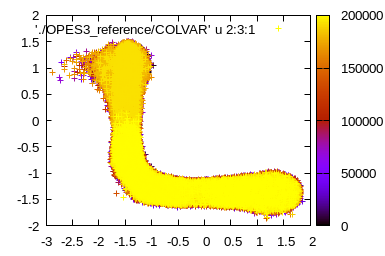

In [277]:
%%gnuplot
p './OPES3_reference/COLVAR' u 2:3:1 pal

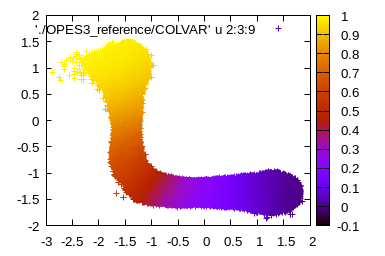

In [278]:
%%gnuplot
p './OPES3_reference/COLVAR' u 2:3:9 pal

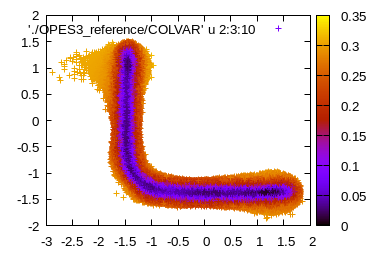

In [279]:
%%gnuplot
p './OPES3_reference/COLVAR' u 2:3:10 pal

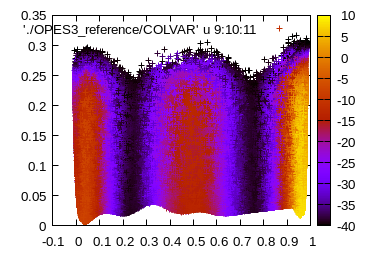

In [280]:
%%gnuplot
p './OPES3_reference/COLVAR' u 9:10:11 pal

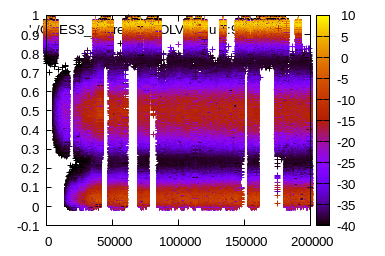

In [281]:
%%gnuplot
p './OPES3_reference/COLVAR' u 1:9:11 pal

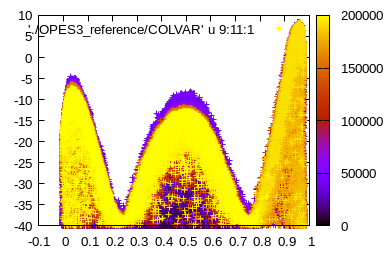

In [282]:
%%gnuplot
p './OPES3_reference/COLVAR' u 9:11:1 pal

In [235]:
skip=10

label=colvar['model_s'].to_numpy()[::skip] 
phi1=colvar['phi1'].to_numpy()[::skip]
phi2=colvar['phi2'].to_numpy()[::skip]
phi3=colvar['phi3'].to_numpy()[::skip]


print(phi1.shape)
print(phi2.shape)
print(phi3.shape)

import plotly.graph_objects as go


fig = go.Figure(data=go.Scatter3d(
    x=phi1,
    y=phi2,
    z=phi3,
    mode='markers',
    marker=dict(
        size=5,
        color=label,            
        colorscale='electric',  
        opacity=0.2,
        colorbar=dict(title=r's')
    )
))

fig.update_layout(
    scene=dict(
        xaxis=dict(backgroundcolor='#CCCCCC'),
        yaxis=dict(backgroundcolor='#CCCCCC'),
        zaxis=dict(backgroundcolor='#CCCCCC', gridcolor='rgba(0, 0, 0, 0)')
    )
)

fig.update_layout(
    scene=dict(
        xaxis=dict(title=r'ϕ1'),
        yaxis=dict(title=r'ϕ2'),
        zaxis=dict(title=r'ϕ3')
    )
)

fig.show()


(3257,)
(3257,)
(3257,)


In [236]:
skip=50 

label=colvar['model_z'].to_numpy()[::skip] 
phi1=colvar['phi1'].to_numpy()[::skip]
phi2=colvar['phi2'].to_numpy()[::skip]
phi3=colvar['phi3'].to_numpy()[::skip]


print(phi1.shape)
print(phi2.shape)
print(phi3.shape)

import plotly.graph_objects as go


fig = go.Figure(data=go.Scatter3d(
    x=phi1,
    y=phi2,
    z=phi3,
    mode='markers',
    marker=dict(
        size=5,
        color=label,            
        colorscale='electric',  
        opacity=0.2,
        colorbar=dict(title=r'z')
    )
))

fig.update_layout(
    scene=dict(
        xaxis=dict(backgroundcolor='#CCCCCC'),
        yaxis=dict(backgroundcolor='#CCCCCC'),
        zaxis=dict(backgroundcolor='#CCCCCC', gridcolor='rgba(0, 0, 0, 0)')
    )
)

fig.update_layout(
    scene=dict(
        xaxis=dict(title=r'ϕ1'),
        yaxis=dict(title=r'ϕ2'),
        zaxis=dict(title=r'ϕ3')
    )
)

fig.show()


(652,)
(652,)
(652,)


In [237]:
#free energy estimations

In [301]:
!python FES_from_Reweighting.py --colvar OPES3/COLVAR --temp 300 --cv model_s --sigma 0.04 --bin 150 --blocks 10 --bias opes.bias --outfile fes-rew-DeepLNE.dat


 using cv "model_s" found at column 9
 using bias "opes.bias" found at column 11
 printing 10 FES files, one every 40000 samples
+++ IMPORTANT: remember to try different numbers of blocks and check for the convergence of the uncertainty estimate +++
 printing final FES with block average to fes-rew-DeepLNE.dat
 number of blocks is 10, while effective number is 8.94215
 average FES uncertainty is: 0.5990216584162383
                              


+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


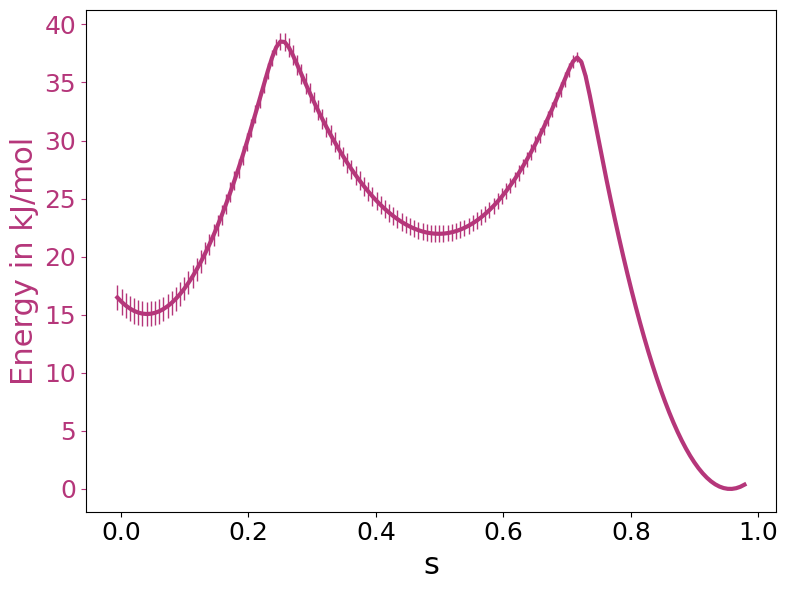

In [302]:
import plumed
magma = plt.colormaps["magma_r"]
norm = mcolors.Normalize(vmin=0, vmax=10)

data=plumed.read_as_pandas("fes-rew-DeepLNE.dat" )

fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
plt.errorbar(data['model_s'], data['file.free'], yerr=data['uncertainty'], color=magma(norm(5)),linewidth=1)
plt.plot(data['model_s'], data['file.free'], color=magma(norm(5)),linewidth=3)
plt.ylabel(r'Energy in kJ/mol', color=magma(norm(5)),fontsize=22)
plt.xlabel('s',fontsize=22)

plt.tick_params(axis='y', colors=magma(norm(5)))
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.tight_layout()
plt.show()

In [303]:
colvar = plumed.read_as_pandas("./OPES3/COLVAR")


cutoff_value = 0.2  # Define your cutoff value here
filtered_df = colvar.loc[colvar['model_z'] <= cutoff_value]
filtered_df = filtered_df.reset_index(drop=True)

plumed.write_pandas(filtered_df,"./OPES3/COLVAR_DeepLNE_reweight")

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


In [304]:
!python FES_from_Reweighting.py --colvar OPES3/COLVAR_DeepLNE_reweight --temp 300 --cv model_s --sigma 0.04 --bin 150 --blocks 10 --bias opes.bias --outfile fes-rew-DeepLNE.dat


 using cv "model_s" found at column 9
 using bias "opes.bias" found at column 11
 printing 10 FES files, one every 35569 samples
 first 3 samples discarded to fit with given stride
+++ IMPORTANT: remember to try different numbers of blocks and check for the convergence of the uncertainty estimate +++
 printing final FES with block average to fes-rew-DeepLNE.dat
 number of blocks is 10, while effective number is 8.94275
 average FES uncertainty is: 0.5971435827344486
                              


In [305]:
colvar = plumed.read_as_pandas("./OPES3_reference/COLVAR")

cutoff_value = 0.2  # Define your cutoff value here
filtered_df = colvar.loc[colvar['model_z'] <= cutoff_value]
filtered_df = filtered_df.reset_index(drop=True)

plumed.write_pandas(filtered_df,"./OPES3_reference/COLVAR_reference_reweight")

+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


In [306]:
!python FES_from_Reweighting.py --colvar ./OPES3_reference/COLVAR_reference_reweight --temp 300 --cv model_s --sigma 0.04 --bin 150 --blocks 10 --bias opes.bias --outfile fes-rew-reference.dat


 using cv "model_s" found at column 9
 using bias "opes.bias" found at column 11
 printing 10 FES files, one every 32145 samples
 first 8 samples discarded to fit with given stride
+++ IMPORTANT: remember to try different numbers of blocks and check for the convergence of the uncertainty estimate +++
 printing final FES with block average to fes-rew-reference.dat
 number of blocks is 10, while effective number is 5.64094
 average FES uncertainty is: 2.179540522165238
                              


38.684768 40.066507


+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++
+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt

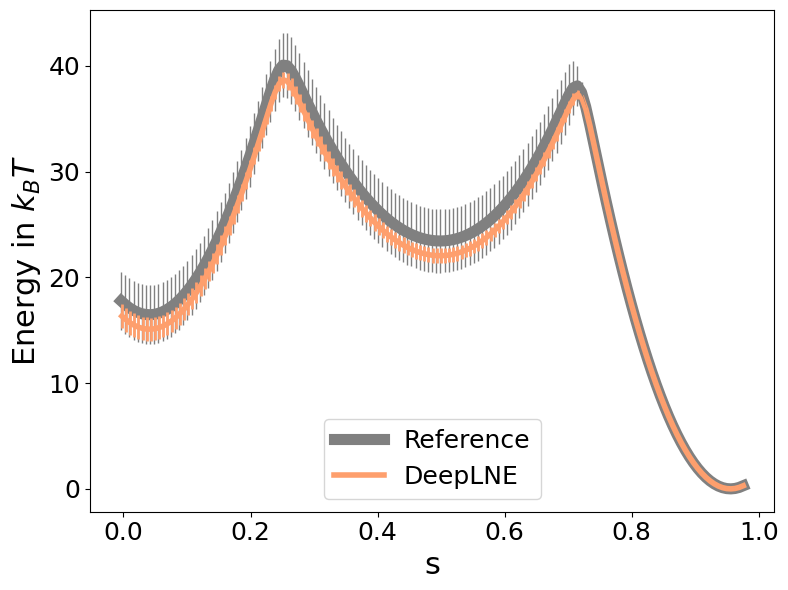

In [345]:
import plumed

magma = plt.colormaps["magma_r"]
norm = mcolors.Normalize(vmin=0, vmax=10)

DeepLNEc=magma(norm(2))
refc=magma(norm(10))

data1=plumed.read_as_pandas("fes-rew-DeepLNE.dat" )
data=plumed.read_as_pandas("fes-rew-reference.dat" )

print(np.max(data1['file.free']),np.max(data['file.free']))

fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
plt.errorbar(data['model_s'], data['file.free'], yerr=data['uncertainty'], color='gray',linewidth=1)
plt.plot(data['model_s'], data['file.free'], color='gray',linewidth=8,alpha=1,label='Reference')
plt.errorbar(data1['model_s'], data1['file.free'], yerr=data1['uncertainty'], color=DeepLNEc,linewidth=2)
plt.plot(data1['model_s'], data1['file.free'], color=DeepLNEc,linewidth=4,label='DeepLNE')
plt.ylabel(r'Energy in $k_BT$',fontsize=22)
plt.xlabel('s',fontsize=22)

plt.tick_params(axis='y')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.legend(loc='lower center',fontsize=18, markerscale=3)
plt.tight_layout()
plt.show()

In [328]:
!python FES_from_Reweighting.py --colvar OPES3/COLVAR --temp 300 --cv model_s,model_z --sigma 0.04,0.04 --bin 150,150 --blocks 10 --bias opes.bias --outfile fes2d-DeepLNE-sz.dat


 using cv "model_s" found at column 9
 using cv "model_z" found at column 10
 using bias "opes.bias" found at column 11
 printing 10 FES files, one every 40000 samples
+++ IMPORTANT: remember to try different numbers of blocks and check for the convergence of the uncertainty estimate +++
 printing final FES with block average to fes2d-DeepLNE-sz.dat
 number of blocks is 10, while effective number is 8.94215
 average FES uncertainty is: 0.593194002013021
                              


+++ Loading the PLUMED kernel runtime +++
+++ PLUMED_KERNEL="/home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so" +++
+++ An error occurred. Message from dlopen(): /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumedKernel.so: undefined symbol: _ZN5torch3jit6MethodclESt6vectorIN3c106IValueESaIS4_EERKSt13unordered_mapINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEES4_St4hashISD_ESt8equal_toISD_ESaISt4pairIKSD_S4_EEE +++
+++ This error is expected if you are trying to load a kernel <=2.4
+++ Trying /home/rizziv@farma.unige.ch/plumed2-2.9/src/lib/libplumed.so +++


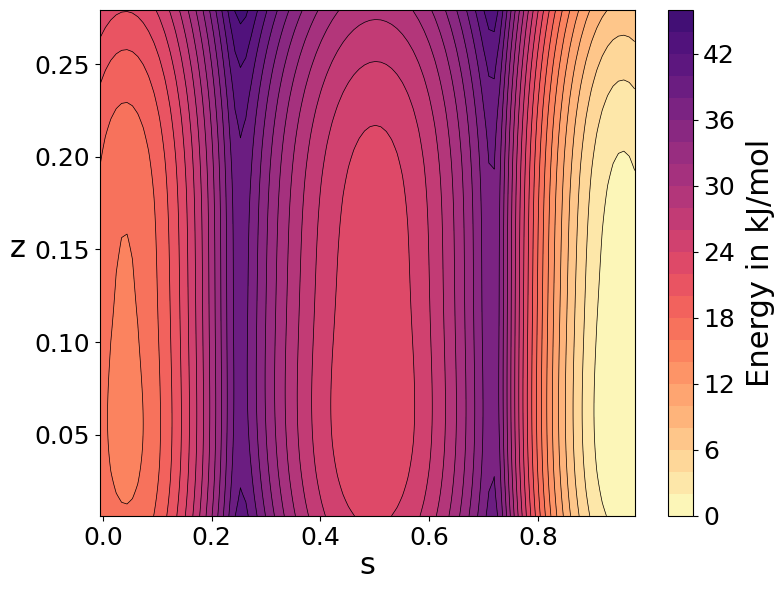

In [342]:

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


data=plumed.read_as_pandas("fes2d-DeepLNE-sz.dat" )


phi_values = data['model_s']
psi_values = data['model_z']
file_free_values = data['file.free']

phi_grid, psi_grid = np.meshgrid(np.linspace(phi_values.min(), phi_values.max(), 100),
                                 np.linspace(psi_values.min(), psi_values.max(), 100))

fig, ax = plt.subplots(1, figsize=(8,6), dpi=100)
file_free_grid = griddata((phi_values, psi_values), file_free_values, (phi_grid, psi_grid), method='cubic')

levels=np.arange(0,48,2)
s = plt.contourf(phi_grid, psi_grid, file_free_grid,levels, cmap=new_magma)

levels=np.arange(2,48,2)
plt.contour(phi_grid, psi_grid,file_free_grid,levels,colors='black', linewidths=0.5)

cbar = plt.colorbar(s, shrink=1)
cbar.set_label(r'Energy in kJ/mol', rotation=90, labelpad=8,fontsize=22)
cbar.ax.tick_params(labelsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('s',fontsize=22,labelpad=1)
plt.ylabel('z', rotation=0,fontsize=22,labelpad=12)
plt.tight_layout()
plt.show()